In [ ]:
import tensorflow as tf
from tensorflow.keras import layers

import matplotlib.pyplot as plt
import numpy as np
import os
import time
from glob import glob
import math
import pandas as pd
import cv2

In [ ]:
print(tf.__version__)

2.4.1


In [ ]:
!nvidia-smi

NVIDIA-SMI has failed because it couldn't communicate with the NVIDIA driver. Make sure that the latest NVIDIA driver is installed and running.



# Data

In [ ]:
#Download face dataset

In [ ]:
#!unzip -q face_dataset.zip

In [ ]:
!unzip -q created_dataset.zip

In [ ]:
len(os.listdir("created_dataset"))

8954

In [ ]:
# df = pd.read_csv("fixed_images.csv", index_col=0)

In [ ]:
# face_df = df[['group', 'image_path', 'x1', 'y1', 'w', 'h']]

In [ ]:
# face_df.head(3)

,group,image_path,x1,y1,w,h
0,0--Parade,0--Parade/0_Parade_marchingband_1_808.jpg,543,68,71,111
2,0--Parade,0--Parade/0_Parade_marchingband_1_1038.jpg,332,128,210,296
3,0--Parade,0--Parade/0_Parade_marchingband_1_1038.jpg,542,232,184,266


In [ ]:
# face_df["image_path"].unique().size

4477

## Random Images

In [ ]:
def get_vertical_new_axes(params, final_image_size=128):
    boxes_width, boxes_height, height, width, vertical_smaller, horizontal_smaller, space_up, space_down, space_left, space_right = params
    # First find horizontal accomodation
    if horizontal_smaller == "left":
        min_width = 0
        while True:
            # space we take from the left size
            box_left_space = np.random.randint(min_width, space_left + 1)
            current_box_size = box_left_space + boxes_width

            if current_box_size >= final_image_size:
                min_width_needed = 0
            else:
                min_width_needed = (final_image_size - current_box_size)

            if boxes_height >= current_box_size and boxes_height >= final_image_size:
                min_width_needed = (boxes_height - current_box_size)

            if space_right >= min_width_needed:
                break
            else:
                min_width = box_left_space

        # space we take from the right size
        box_right_space = np.random.randint(min_width_needed, space_right + 1)
        image_horizontal_space = box_left_space + boxes_width + box_right_space

    else:
        min_width = 0
        while True:
            box_right_space = np.random.randint(min_width, space_right + 1) # check what happen when i have the same number in both parameters
            current_box_size = box_right_space + boxes_width
            min_width_needed = 0 if current_box_size >= final_image_size else (final_image_size - current_box_size)

            if current_box_size >= final_image_size:
                min_width_needed = 0
            else:
                min_width_needed = (final_image_size - current_box_size)

            if boxes_height >= current_box_size and boxes_height >= final_image_size:
                min_width_needed = (boxes_height - current_box_size)

            if space_left >= min_width_needed:
                break
            else:
                min_width = box_right_space

        # space we take from the left size
        box_left_space = np.random.randint(min_width_needed, space_left + 1)
        image_horizontal_space = box_right_space + boxes_width + box_left_space

    # Then find vertical accomodation
    if vertical_smaller == "up":
        min_height = 0  
        max_height = space_up + 1

        while True:
            box_up_space = np.random.randint(min_height, max_height)
            current_box_size = box_up_space + boxes_height
            min_height_needed = image_horizontal_space - current_box_size # -10

            if current_box_size > image_horizontal_space:
                max_height = box_up_space
                continue

            if space_down >= min_height_needed:
                break
            else:
                # we need more space in the up size
                min_height = box_up_space

            # space we take from the down side
        box_down_space = min_height_needed #np.random.randint(min_height_needed, image_horizontal_space)
        image_vertical_space = box_up_space + boxes_height + box_down_space
        
    else:
        min_height = 0  
        max_height = space_down + 1

        while True:
            box_down_space = np.random.randint(min_height, max_height)
            current_box_size = box_down_space + boxes_height
            min_height_needed = image_horizontal_space - current_box_size

            if current_box_size > image_horizontal_space:
                # our current box height is higher than the wider box
                max_height = box_down_space
                continue

            if space_up >= min_height_needed:
                break
            else:
                # we need more space in the up size
                min_height = box_down_space

        # space we take from the left size
        box_up_space = min_height_needed #np.random.randint(min_height_needed, image_horizontal_space)
        image_vertical_space = box_down_space + boxes_height + box_up_space

    return image_vertical_space, image_horizontal_space, box_up_space, box_down_space, box_right_space, box_left_space

In [ ]:
def get_horizontal_new_axes(params, final_image_size=128):
    boxes_width, boxes_height, height, width, vertical_smaller, horizontal_smaller, space_up, space_down, space_left, space_right = params
    borders = 0
    if boxes_width > height:
        diff = width - height

        if (diff // 2) < 100:
            borders = (diff // 2) - 2
        else:
            borders = 100
        
        space_up += borders
        space_down += borders

    # First find vertical acomodation
    if vertical_smaller == "up":
        min_height = 0

        while True:
            box_up_space = np.random.randint(min_height, space_up + 1)
            current_box_size = box_up_space + boxes_height
            
            # If the current space used is greater than the final image size
            if current_box_size >= final_image_size: # final_image_size = 128
                min_height_needed = 0
            else:
                min_height_needed = (final_image_size - current_box_size)

            # If our current space usage is less than the space used in the width
            # we need more space
            if boxes_width >= current_box_size and boxes_width >= final_image_size:
                min_height_needed = (boxes_width - current_box_size)

            if space_down >= min_height_needed:
                break
            else:
                min_height = box_up_space # use more space

        # space we take from the down side
        box_down_space = np.random.randint(min_height_needed, space_down + 1)
        image_vertical_space = box_up_space + boxes_height + box_down_space
        
    else:
        min_height = 0

        while True:
            box_down_space = np.random.randint(min_height, space_down + 1)
            current_box_size = box_down_space + boxes_height

            if current_box_size >= final_image_size: # final_image_size = 128
                min_height_needed = 0
            else:
                min_height_needed = (final_image_size - current_box_size)

            if boxes_width >= current_box_size and boxes_width >= final_image_size:
                min_height_needed = (boxes_width - current_box_size)

            if space_up >= min_height_needed:
                break
            else:
                min_height = box_down_space # use more space

        # space we take from the up side
        box_up_space = np.random.randint(min_height_needed, space_up + 1)
        image_vertical_space = box_down_space + boxes_height + box_up_space
        
    # Then horizontal accomodation
    if horizontal_smaller == "left":
        min_width = 0
        max_width = space_left + 1

        while True:
            # space we take from the left size
            box_left_space = np.random.randint(min_width, max_width)
            current_box_size = box_left_space + boxes_width
            min_width_needed = image_vertical_space - current_box_size # -10

            if current_box_size > image_vertical_space:
                max_width = box_left_space
                continue

            if space_right >= min_width_needed:
                break
            else:
                # we need more space in the up size
                min_width = box_left_space

        # space we take from the right size
        box_right_space = min_width_needed
        image_horizontal_space = box_left_space + boxes_width + box_right_space

    else:
        min_width = 0
        max_width = space_right + 1

        while True:
            box_right_space = np.random.randint(min_width, max_width)
            current_box_size = box_right_space + boxes_width
            min_width_needed = image_vertical_space - current_box_size

            if current_box_size > image_vertical_space:
                max_width = box_right_space
                continue

            if space_left >= min_width_needed:
                break
            else:
                min_width = box_right_space

        # space we take from the left size
        box_left_space = min_width_needed
        image_horizontal_space = box_right_space + boxes_width + box_left_space

    return image_vertical_space, image_horizontal_space, box_up_space, box_down_space, box_right_space, box_left_space, borders


# Data Utils

In [ ]:
def get_box_sizes(boxes):
  max_box_height = 0
  min_box_height = 99999

  max_box_width = 0
  min_box_width = 99999

  for box in boxes: # For each face in image
    x1 = box[0]
    y1 = box[1]

    x2 = (box[0] + box[2])
    y2 = (box[1] + box[3])

    current_min_box_height = y1
    current_max_box_height = y2

    if min_box_height > current_min_box_height:
        min_box_height = current_min_box_height

    if current_max_box_height > max_box_height:
        max_box_height = current_max_box_height

    current_min_box_width = x1
    current_max_box_width = x2

    if min_box_width > current_min_box_width:
        min_box_width = current_min_box_width

    if current_max_box_width > max_box_width:
        max_box_width = current_max_box_width

  return max_box_height, min_box_height, max_box_width, min_box_width

In [ ]:
def get_random_image(img, boxes):
  H, W, C = img.shape

  # Get the corners of all the boxes to know where we can cut the image
  max_box_height, min_box_height, max_box_width, min_box_width = get_box_sizes(boxes)

  boxes_height = max_box_height - min_box_height
  boxes_width = max_box_width - min_box_width

  space_up = min_box_height
  space_down = H - max_box_height

  space_left = min_box_width
  space_right = W - max_box_width

  horizontal_smaller = "left" if space_right > space_left else "right"
  vertical_smaller = "up" if space_down > space_up else "down"

  small_direction = "horizontal" if H >= W else "vertical"

  params = [boxes_width, boxes_height, H, W, vertical_smaller, horizontal_smaller, space_up, space_down, space_left, space_right]

  if small_direction == "vertical":
      image_vertical_space, image_horizontal_space, box_up_space, box_down_space, box_right_space, box_left_space, borders = get_horizontal_new_axes(params)
  else:
      image_vertical_space, image_horizontal_space, box_up_space, box_down_space, box_right_space, box_left_space = get_vertical_new_axes(params)
      borders = 0

  image_x1 = min_box_width - box_left_space 
  image_x2 = max_box_width + box_right_space

  image_y1 = (min_box_height + borders) - box_up_space
  image_y2 = (max_box_height + borders) + box_down_space

  if borders > 0:
    new_img = np.zeros([H + (borders * 2), W, C], dtype=np.uint8)
    H, W, C = new_img.shape

    new_img[borders:H - borders, :, :] = img
    img = new_img

  resized = img[image_y1:image_y2, image_x1:image_x2, :]

  H, W, C = resized.shape

  try:
    resized = cv2.resize(resized, (128, 128), interpolation=cv2.INTER_AREA)
  except:
    print(resized.shape)
    print(image_x1, image_y1, image_x2, image_y2)
    print(borders)
    print(min_box_height)
    print(max_box_height, "max_box_height")
    print(box_down_space, "box_down_space")

    raise Exception("Image error")

  new_boxes = []

  for box in boxes: # For each face in image
    x1 = box[0] 
    y1 = box[1]

    x1 = (x1 - image_x1)
    y1 = ((y1 + borders) - image_y1)

    x2 = (x1 + box[2]) / W
    y2 = (y1 + box[3]) / H

    x1 = x1 / W
    y1 = y1 / H

    new_boxes.append([x1, y1, x2, y2])
  
  return resized, new_boxes

In [ ]:
!mkdir created_dataset

In [ ]:
images_paths = []
boxes_dict = {}

In [ ]:
for img_path, indices in face_df.groupby("image_path").groups.items():
  selected = face_df.loc[indices]
  group = selected.values[0][0]

  if group == "None":
    img_path = img_path.replace("/", "-")
  else:
    img_path = img_path.split("/")[-1]
    
  original_img_path = f"face_dataset/{img_path}"
  original_img = cv2.imread(original_img_path)
  # img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

  img_path = f"created_dataset/set-2-{img_path}"

  boxes = selected.values[:, 2:]

  images_paths.append(img_path)

  resized, new_boxes = get_random_image(original_img, boxes)

  boxes_dict[img_path] = []

  for box in new_boxes:
    x1 = box[0] 
    y1 = box[1]

    x2 = box[2]
    y2 = box[3]
    
    boxes_dict[img_path].append(np.array([x1, y1, x2, y2], dtype=np.float32))
  
  cv2.imwrite(img_path, resized)

  if len(images_paths) % 500 == 0:
    print(len(images_paths))

4500
5000
5500
6000
6500
7000
7500
8000
8500


In [ ]:
len(images_paths)

8954

In [ ]:
np.save("images_paths", np.array(images_paths))

In [ ]:
np.save("boxes_dict", boxes_dict)

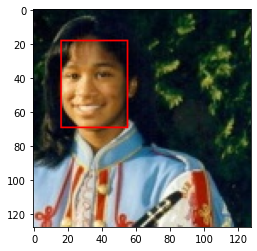

In [ ]:
for img_path in images_paths[40:110]:
  boxes = boxes_dict[img_path]

  img = cv2.imread(img_path)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

  for box in boxes:
    x1 = int(box[0] * 128)
    y1 = int(box[1] * 128)

    x2 = int(box[2] * 128)
    y2 = int(box[3] * 128)

    img = cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 0), 1)
    
  plt.imshow(img)
  break

# Load numpy arrays

In [ ]:
images_paths = np.load('images_paths.npy')
boxes_dict = np.load('boxes_dict.npy', allow_pickle=True)

In [ ]:
boxes_dict = boxes_dict[()]

In [ ]:
boxes_dict[images_paths[0]]

[array([0.0927835 , 0.25773194, 0.5515464 , 0.814433  ], dtype=float32)]

In [ ]:
images_paths[4476], images_paths[4477]

('created_dataset/set-1-originalPics-2003-01-17-big-img_978.jpg',
 'created_dataset/set-2-0_Parade_Parade_0_1019.jpg')

# Generator Utils

In [ ]:
def compute_iou(box, anchor_box):  
  x_min = np.maximum(box[0], anchor_box[0])
  y_min = np.maximum(box[1], anchor_box[1])
  x_max = np.minimum(box[2], anchor_box[2])
  y_max = np.minimum(box[3], anchor_box[3])
  
  overlap_area = np.maximum(0.0, x_max - x_min + 1) * np.maximum(0.0, y_max - y_min + 1)
  
  true_boxes_area = (box[2] - box[0] + 1) * (box[3] - box[1] + 1)
  anchor_boxes_area = (anchor_box[2] - anchor_box[0] + 1) * (anchor_box[3] - anchor_box[1] + 1)
  
  union_area = float(true_boxes_area + anchor_boxes_area - overlap_area)
  
  return overlap_area / union_area

In [ ]:
small_boxes = np.linspace(0.03125, 0.96875, 16, endpoint=True, dtype=np.float32) # 16x16 size of 0.0625
big_boxes = np.linspace(0.0625, .9375, 8, endpoint=True, dtype=np.float32) # 8x8 size of 0.125
list_of_boxes = [small_boxes, big_boxes]

# Generator

In [ ]:
def load_image(image_path):
  img = tf.io.read_file(image_path)
  img = tf.image.decode_jpeg(img, channels=3)
  img = tf.image.convert_image_dtype(img, tf.float32)
  img = tf.image.resize(img, [128, 128])

  return img

## Utils

In [ ]:
def create_boxes(boxes, horizontal):
  indices_list = {"small": [], "big": []}
  coords_list = {"small": [], "big": []}

  box_type = {"0.03125": "small", "0.0625": "big"}

  for box in boxes: # For each face in image
    box_x1 = box[0]
    box_y1 = box[1]

    box_x2 = box[2]
    box_y2 = box[3]

    if horizontal:
      w = box_x2 - box_x1
      box_x1 = (1 - box_x1) - w
      box_x2 = (box_x1 + w)

    face_box = np.array([box_x1, box_y1, box_x2, box_y2])

    iou = 0.01

    for box_values in list_of_boxes:
      best_indices = []
      best_coords = []

      for y_index, y_coord in enumerate(box_values): # y space
        for x_index, x_coord in enumerate(box_values): # x space we move throughout x, y keep its value and x change
          x1 = x_coord - box_values[0]
          y1 = y_coord - box_values[0]

          x2 = x_coord + box_values[0]
          y2 = y_coord + box_values[0]

          anchor_box = np.array([x1, y1, x2, y2])

          current_iou = compute_iou(face_box * 128.0, anchor_box * 128.0)

          if current_iou >= iou:
            iou = current_iou

            best_indices.append([x_index, y_index])
            best_coords.append(face_box)

      indices_list[box_type[str(box_values[0])]].extend(best_indices)
      coords_list[box_type[str(box_values[0])]].extend(best_coords)

  big_anchor = np.zeros((8, 8, 5))

  indices = indices_list["big"]
  coords = coords_list["big"]

  for index in range(len(indices)):
    x_index, y_index = indices[index]
    box = coords[index].tolist()
    big_anchor[y_index, x_index] = [1, *box]

  small_anchor = np.zeros((16, 16, 5))

  indices = indices_list["small"]
  coords = coords_list["small"]

  for index in range(len(indices)):
    x_index, y_index = indices[index]
    box = coords[index].tolist()
    small_anchor[y_index, x_index] = [1, *box]

  return big_anchor, small_anchor

In [ ]:
def get_boxes_from_dictionary(image_path, horizontal):
  key = image_path.numpy().decode("utf-8") 
  boxes = boxes_dict[key]

  horizontal = bool(horizontal)

  big_anchor, small_anchor = create_boxes(boxes, horizontal)

  return big_anchor, small_anchor

In [ ]:
def load_train_image(image_path):
  img = load_image(image_path)

  if tf.random.uniform([]) > 0.5:
    img = tf.image.random_saturation(img, 0.5, 1.5)

  if tf.random.uniform([]) > 0.5:
    img = tf.image.random_brightness(img, 0.2)

  horizontal = tf.random.uniform([]) > 0.5

  if horizontal:
    img = tf.image.flip_left_right(img)

  big_anchor, small_anchor = tf.py_function(get_boxes_from_dictionary, [image_path, horizontal], [tf.float32, tf.float32])

  return img, big_anchor, small_anchor, image_path, horizontal

In [ ]:
def load_test_image(image_path):
  img = load_image(image_path)
  big_anchor, small_anchor = tf.py_function(get_boxes_from_dictionary, [image_path, False], [tf.float32, tf.float32])

  return image_path, img, big_anchor, small_anchor

In [ ]:
test_dataset = tf.data.Dataset.from_tensor_slices((images_paths))
test_dataset = test_dataset.map(load_test_image, num_parallel_calls=tf.data.experimental.AUTOTUNE)
test_generator = test_dataset.batch(32)

In [ ]:
train_dataset = tf.data.Dataset.from_tensor_slices((images_paths))
train_dataset = train_dataset.shuffle(len(images_paths))
train_dataset = train_dataset.map(load_train_image, num_parallel_calls=tf.data.experimental.AUTOTUNE)
train_generator = train_dataset.batch(32)

# Create Anchors

In [ ]:
small_x = tf.tile(tf.repeat(small_boxes, repeats=2), [16]) # x
small_y = tf.repeat(small_boxes, repeats=32)

small = tf.stack([small_x, small_y], axis=1)

In [ ]:
big_x = tf.tile(tf.repeat(big_boxes, repeats=6), [8]) # x
big_y = tf.repeat(big_boxes, repeats=48)

big = tf.stack([big_x, big_y], axis=1)

In [ ]:
reference_anchors = tf.concat([small, big], axis=0)

# Model

In [ ]:
class BlazeBlock(tf.keras.Model):
  def __init__(self, filters, strides=1):
    super(BlazeBlock, self).__init__()
    self.strides = strides
    self.filters = filters

    if strides == 2:
      self.pool = layers.MaxPool2D()

    self.dw_conv = layers.DepthwiseConv2D((3, 3), strides=strides, padding="same")
    self.conv = layers.Conv2D(filters, (1, 1), strides=(1, 1))

    self.norm_1 = layers.BatchNormalization()
    self.norm_2 = layers.BatchNormalization()

    self.activation = layers.ReLU()
  
  def call(self, x_input):
    x = self.dw_conv(x_input)
    x = self.norm_1(x)
    x = self.conv(x)
    x = self.norm_2(x)
    
    if self.strides == 2:
      x_input = self.pool(x_input)
    
    padding = self.filters - x_input.shape[-1]
    
    if padding != 0:
      padding_values = [[0, 0], [0, 0], [0, 0], [0, padding]]
      x_input = tf.pad(x_input, padding_values)
    
    x = x + x_input
    x = self.activation(x)

    return x

In [ ]:
class BlazeModel(tf.keras.Model):
  def __init__(self):
    super(BlazeModel, self).__init__()

    self.conv = layers.Conv2D(24, (3, 3), strides=2, padding="same")
    self.activation = layers.ReLU()

    self.block_1 = BlazeBlock(24)
    self.block_2 = BlazeBlock(28)
    self.block_3 = BlazeBlock(32, strides=2)
    self.block_4 = BlazeBlock(36)
    self.block_5 = BlazeBlock(42)

    self.block_6 = BlazeBlock(48, strides=2)
    self.block_7 = BlazeBlock(56)
    self.block_8 = BlazeBlock(64)
    self.block_9 = BlazeBlock(72)
    self.block_10 = BlazeBlock(80)
    self.block_11 = BlazeBlock(88)

    self.block_12 = BlazeBlock(96, strides=2)
    self.block_13 = BlazeBlock(96)
    self.block_14 = BlazeBlock(96)
    self.block_15 = BlazeBlock(96)

    self.classifier_8 = layers.Conv2D(2, (1, 1), strides=(1, 1), activation="sigmoid")
    self.classifier_16 = layers.Conv2D(6, (1, 1), strides=(1, 1), activation="sigmoid")

    self.regressor_8 = layers.Conv2D(8, (1, 1), strides=(1, 1)) # 32
    self.regressor_16 = layers.Conv2D(24, (1, 1), strides=(1, 1)) # 96
  
  def call(self, x):
    B, H, W, C = x.shape

    x = self.conv(x)
    x = self.activation(x) # (B, 64, 64, 24)

    x = self.block_1(x) # (B, 64, 64, 24)
    x = self.block_2(x) # (B, 64, 64, 28)
    x = self.block_3(x) # (B, 32, 32, 32)
    x = self.block_4(x) # (B, 32, 32, 36)
    x = self.block_5(x) # (B, 32, 32, 42)

    # Double Blocks

    x = self.block_6(x) # (4, 16, 16, 48)
    x = self.block_7(x) # (4, 16, 16, 56)
    x = self.block_8(x) # (4, 16, 16, 64)
    x = self.block_9(x) # (4, 16, 16, 72)
    x = self.block_10(x) # (4, 16, 16, 80)
    x = self.block_11(x) # (4, 16, 16, 88) output size

    h = self.block_12(x) # (4, 8, 8, 96)
    h = self.block_13(h) # (4, 8, 8, 96)
    h = self.block_14(h) # (4, 8, 8, 96)
    h = self.block_15(h) # (4, 8, 8, 96) output size

    c1 = self.classifier_8(x) # B, 16, 16, 2 output size
    # c1 = layers.Reshape((-1, 1))(c1) # B, 512, 1 output size
    c1 = layers.Reshape((512, 1))(c1) # B, 512, 1 output size

    c2 = self.classifier_16(h) # B, 8, 8, 6 output size
    # c2 = layers.Reshape((-1, 1))(c2) # B, 384, 1 output size
    c2 = layers.Reshape((384, 1))(c2) # B, 384, 1 output size

    c = layers.concatenate([c1, c2], axis=1) # B, 896, 1

    r1 = self.regressor_8(x) # B, 16, 16, 8 output size
    # r1 = layers.Reshape((-1, 4))(r1) # B, 512, 4 output size
    r1 = layers.Reshape((512, 4))(r1) # B, 512, 4 output size

    r2 = self.regressor_16(h) # B, 8, 8, 24 output size
    # r2 = layers.Reshape((-1, 4))(r2) # B, 384, 4 output size
    r2 = layers.Reshape((384, 4))(r2) # B, 384, 4 output size

    r = layers.concatenate([r1, r2], axis=1) # B, 896, 4

    return r, c

# Loss

In [ ]:
huber_loss = tf.keras.losses.Huber()

In [ ]:
def compute_loss(class_predictions, anchor_predictions, big_anchors, small_anchors, reference_anchors, ratio=3, scale=128):
  B = big_anchors.shape[0]
  list_big_anchors = tf.reshape(big_anchors, (B, -1, 5)) # shape [B, 384, 5])

  list_small_anchors = tf.reshape(small_anchors, (B, -1, 5)) # shape [B, 512, 5])

  list_true_anchors = tf.concat([list_small_anchors, list_big_anchors], axis=1) # shape [B, 896, 5]

  true_classes = list_true_anchors[:, :, 0] # shape [B, 896, 1]
  true_coords = list_true_anchors[:, :, 1:] # shape [B, 896, 4]

  faces_mask_bool = tf.dtypes.cast(true_classes, tf.bool)

  faces_num = tf.keras.backend.sum(true_classes)
  background_num = int(faces_num * ratio) // B

  class_predictions = tf.squeeze(class_predictions, axis=-1)

  # Hard negatives

  predicted_classes_scores = tf.where(faces_mask_bool, -99.0, class_predictions) # B, 896

  background_class_predictions = tf.sort(predicted_classes_scores, axis=-1, direction='DESCENDING')[:, :background_num]

  # priority_background_indices = tf.argsort(predicted_classes_scores, axis=-1, direction='DESCENDING')[:, :background_num] # B, 4

  # Use sort instead of argsort

  # background_class_predictions = [tf.gather(batch_element, batch_indices) for batch_element, batch_indices in zip(class_predictions, priority_background_indices)]
  # background_class_predictions = tf.stack(background_class_predictions, axis=0) # B, 4

  # temp_stack = tf.concat([class_predictions, tf.cast(priority_background_indices, tf.float32)], axis=1) # Add the face indices to the end of the tensor
  # background_class_predictions = tf.map_fn(fn=lambda element: tf.gather(element[:896], tf.cast(element[896:896 + background_num], tf.int32)), elems=temp_stack)

  positive_class_predictions = tf.boolean_mask(class_predictions, faces_mask_bool)

  # Class loss

  # print(background_class_predictions)

  background_loss = tf.math.reduce_mean(tf.keras.losses.binary_crossentropy(tf.zeros_like(background_class_predictions), background_class_predictions))
  positive_loss = tf.math.reduce_mean(tf.keras.losses.binary_crossentropy(tf.ones_like(positive_class_predictions), positive_class_predictions))

  # Anchors offset

  # anchor_predictions (shape) B, 894, 4

  x_center = reference_anchors[:, 0:1] + (anchor_predictions[..., 0:1] / scale) # 8, 896, 1
  y_center = reference_anchors[:, 1:2] + (anchor_predictions[..., 1:2] / scale) # 8, 896, 1

  w = anchor_predictions[..., 2:3] / scale # B, 896, 1
  h = anchor_predictions[..., 3:4] / scale # B, 896, 1

  y_min = y_center - h / 2.  # ymin
  x_min = x_center - w / 2.  # xmin
  y_max = y_center + h / 2.  # ymax
  x_max = x_center + w / 2.  # xmax

  offset_boxes = tf.concat([x_min, y_min, x_max, y_max], axis=-1) # B, 896, 4

  filtered_pred_coords = tf.boolean_mask(offset_boxes, faces_mask_bool) # ~faces_num, 4
  filtered_true_coords = tf.boolean_mask(true_coords, faces_mask_bool) # ~faces_num, 4.

  detection_loss = huber_loss(filtered_true_coords, filtered_pred_coords)

  loss = tf.math.reduce_mean(detection_loss) * 150 + (background_loss * 35) + (positive_loss * 35)

  return loss, filtered_pred_coords, filtered_true_coords, positive_class_predictions, background_class_predictions

# Training

## Order anchors

In [ ]:
def order_big_anchors_randomly(big_anchors):
  big_anchor_list = []
  total_boxes = 30

  for batch_element in big_anchors: # B, 8, 8, 5
    box_index = tf.random.uniform([], 0, 6, dtype=tf.dtypes.int32) * 5 # 0, 5, 10, 15, 20, 25

    if box_index == 0:
      right_box = tf.zeros((8, 8, total_boxes - 5))

      anchor_tensor = tf.concat([batch_element, right_box], axis=-1)
      big_anchor_list.append(anchor_tensor)

    elif box_index == 25:
      left_box = tf.zeros((8, 8, total_boxes - 5))

      anchor_tensor = tf.concat([left_box, batch_element], axis=-1)
      big_anchor_list.append(anchor_tensor)

    else:
      left_box = tf.zeros((8, 8, box_index))
      right_box = tf.zeros((8, 8, total_boxes - box_index - 5))

      anchor_tensor = tf.concat([left_box, batch_element, right_box], axis=-1)
      big_anchor_list.append(anchor_tensor)

    
  big_anchor_list = tf.stack(big_anchor_list, axis=0) # B, 8, 8, 30

  return big_anchor_list

In [ ]:
def order_small_anchors_randomly(small_anchors):
  small_anchor_list = []

  for batch_element in small_anchors: # B, 16, 16, 5
    box_index = tf.random.uniform([], 0, 2, dtype=tf.dtypes.int32) * 5 # 0, 5

    if box_index == 0:
      right_box = tf.zeros((16, 16, 5))

      anchor_tensor = tf.concat([batch_element, right_box], axis=-1)
      small_anchor_list.append(anchor_tensor)

    else:
      left_box = tf.zeros((16, 16, 5))

      anchor_tensor = tf.concat([left_box, batch_element], axis=-1)
      small_anchor_list.append(anchor_tensor)
    
  small_anchor_list = tf.stack(small_anchor_list, axis=0) # B, 16, 16, 10

  return small_anchor_list

## Train Functions

In [ ]:
def plot_metrics(loss, p_accuracy, b_accuracy, iou):
  fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20, 8))

  ax1.plot(np.arange(len(loss)), loss)
  ax1.set_title('Loss')

  ax2.plot(np.arange(len(p_accuracy)), p_accuracy)
  ax2.set_title('Positive Accuracy')

  ax3.plot(np.arange(len(b_accuracy)), b_accuracy)
  ax3.set_title('Background Accuracy')

  ax4.plot(np.arange(len(iou)), iou)
  ax4.set_title('IoU')

In [ ]:
def mean_iou(true_boxes, pred_boxes, return_mean=True):
  x_min = tf.math.maximum(true_boxes[..., 0], pred_boxes[..., 0])
  y_min = tf.math.maximum(true_boxes[..., 1], pred_boxes[..., 1])
  x_max = tf.math.minimum(true_boxes[..., 2], pred_boxes[..., 2])
  y_max = tf.math.minimum(true_boxes[..., 3], pred_boxes[..., 3])
  
  overlap_area = tf.math.maximum(0.0, x_max - x_min + 1) * tf.math.maximum(0.0, y_max - y_min + 1)
  
  true_boxes_area = (true_boxes[..., 2] - true_boxes[..., 0] + 1) * (true_boxes[..., 3] - true_boxes[..., 1] + 1)
  
  predicted_boxes_area = (pred_boxes[..., 2] - pred_boxes[..., 0] + 1) * (pred_boxes[..., 3] - pred_boxes[..., 1] + 1)
  
  union_area = (true_boxes_area + predicted_boxes_area - overlap_area)

  if return_mean:
    return tf.math.reduce_mean(overlap_area / union_area)
  else:
    return overlap_area / union_area

In [ ]:
batch_size = 32
epochs = 100
lr = 1e-4
optimizer = tf.keras.optimizers.Adam(learning_rate=lr)

In [ ]:
train_steps = int(len(images_paths) / batch_size) + 1

In [ ]:
model = None
model = BlazeModel()

In [ ]:
!unzip -q training_checkpoints

In [ ]:
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")

In [ ]:
checkpoint = tf.train.Checkpoint(model=model,
                                 optimizer=optimizer)

In [ ]:
print(tf.train.latest_checkpoint(checkpoint_dir))

./training_checkpoints/ckpt-500


In [ ]:
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))
# checkpoint.restore("./training_checkpoints/ckpt-410")

In [ ]:
# !rm -rf training_checkpoints/

In [ ]:
positive_accuracy_metric = tf.keras.metrics.BinaryAccuracy()
background_accuracy_metric = tf.keras.metrics.BinaryAccuracy()

In [ ]:
background_accuracy_results = []
positive_accuracy_results = []
loss_results = []
iou_results = []

In [ ]:
@tf.function
def train_step(imgs, big_anchors, small_anchors, reference_anchors, model):
  with tf.GradientTape() as tape:
    anchor_predictions, class_predictions = model(imgs, training=True)

    loss, filtered_pred_coords, filtered_true_coords, positive_class_predictions, background_class_predictions = compute_loss(class_predictions, anchor_predictions, big_anchors, small_anchors, reference_anchors)

  gradients = tape.gradient(loss, model.trainable_variables)

  optimizer.apply_gradients(zip(gradients, model.trainable_variables))

  return loss, filtered_pred_coords, filtered_true_coords, positive_class_predictions, background_class_predictions

In [ ]:
def train(epochs):
  for epoch in range(epochs):
    batch_time = time.time()
    epoch_time = time.time()
    step = 0
    epoch_count = f"0{epoch + 1}/{epochs}" if epoch < 9 else f"{epoch + 1}/{epochs}"

    positive_accuracy_metric.reset_states()
    background_accuracy_metric.reset_states()

    for imgs, big_anchors, small_anchors, _, _ in train_generator:
      small_anchors = order_small_anchors_randomly(small_anchors)
      big_anchors = order_big_anchors_randomly(big_anchors)

      loss, filtered_pred_coords, filtered_true_coords, positive_class_predictions, background_class_predictions = train_step(imgs, big_anchors, small_anchors, reference_anchors, model)
      
      positive_accuracy_metric.update_state(tf.ones_like(positive_class_predictions), positive_class_predictions)
      background_accuracy_metric.update_state(tf.zeros_like(background_class_predictions), background_class_predictions)

      loss = float(loss)
      step += 1

      positive_accuracy = positive_accuracy_metric.result().numpy()
      background_accuracy = background_accuracy_metric.result().numpy()

      iou = mean_iou(filtered_true_coords * 128.0, filtered_pred_coords * 128.0)

      iou_results.append(iou)
      background_accuracy_results.append(background_accuracy)
      positive_accuracy_results.append(positive_accuracy)
      loss_results.append(loss)

      print('\r', 'Epoch', epoch_count, '| Step', f"{step}/{train_steps}",
            '| Loss:', f"{loss:.5f}", '| Positive Accuracy:', f"{positive_accuracy:.4f}",
            '| Background Accuracy:', f"{background_accuracy:.4f}",
            '| iou:', f"{iou:.4f}", "| Step Time:", f"{time.time() - batch_time:.2f}", end='')    
        
      batch_time = time.time()

    checkpoint.save(file_prefix=checkpoint_prefix)

    print('\r', 'Epoch', epoch_count, '| Step', f"{step}/{train_steps}",
          '| Loss:', f"{loss:.5f}", '| Positive Accuracy:', f"{positive_accuracy:.4f}",
          '| Background Accuracy:', f"{background_accuracy:.4f}",
          '| iou:', f"{iou:.4f}", "| Epoch Time:", f"{time.time() - epoch_time:.2f}")

## Train Epochs 

In [ ]:
train(25)

 Epoch 01/25 | Step 280/280 | Loss: 56.81091 | Positive Accuracy: 0.3453 | Background Accuracy: 0.3325 | iou: 0.0003 | Epoch Time: 181.68
 Epoch 02/25 | Step 280/280 | Loss: 55.75742 | Positive Accuracy: 0.5280 | Background Accuracy: 0.2902 | iou: 0.0005 | Epoch Time: 170.39
 Epoch 03/25 | Step 280/280 | Loss: 59.32439 | Positive Accuracy: 0.5437 | Background Accuracy: 0.3167 | iou: 0.0004 | Epoch Time: 170.22
 Epoch 04/25 | Step 280/280 | Loss: 56.61921 | Positive Accuracy: 0.5593 | Background Accuracy: 0.3359 | iou: 0.0013 | Epoch Time: 169.80
 Epoch 05/25 | Step 280/280 | Loss: 57.20434 | Positive Accuracy: 0.5432 | Background Accuracy: 0.3639 | iou: 0.0090 | Epoch Time: 169.78
 Epoch 06/25 | Step 280/280 | Loss: 51.31102 | Positive Accuracy: 0.4835 | Background Accuracy: 0.3875 | iou: 0.3870 | Epoch Time: 170.06
 Epoch 07/25 | Step 280/280 | Loss: 50.88303 | Positive Accuracy: 0.4788 | Background Accuracy: 0.4458 | iou: 0.3982 | Epoch Time: 172.28
 Epoch 08/25 | Step 280/280 | Loss

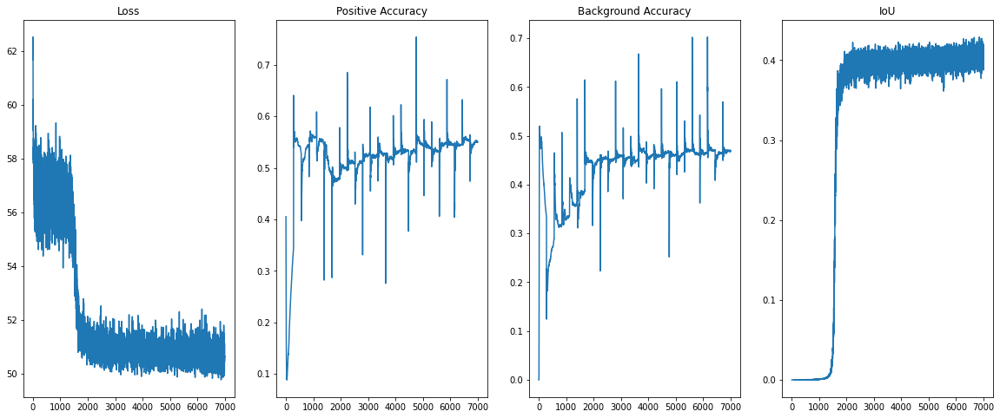

In [ ]:
plot_metrics(loss_results, positive_accuracy_results, background_accuracy_results, iou_results)

In [ ]:
train(50)

 Epoch 01/50 | Step 280/280 | Loss: 51.25629 | Positive Accuracy: 0.5462 | Background Accuracy: 0.4756 | iou: 0.4058 | Epoch Time: 164.91
 Epoch 02/50 | Step 280/280 | Loss: 49.92316 | Positive Accuracy: 0.5540 | Background Accuracy: 0.4730 | iou: 0.4143 | Epoch Time: 166.91
 Epoch 03/50 | Step 280/280 | Loss: 50.39587 | Positive Accuracy: 0.5504 | Background Accuracy: 0.4756 | iou: 0.4096 | Epoch Time: 166.55
 Epoch 04/50 | Step 280/280 | Loss: 50.70751 | Positive Accuracy: 0.5593 | Background Accuracy: 0.4761 | iou: 0.4230 | Epoch Time: 164.96
 Epoch 05/50 | Step 280/280 | Loss: 50.25116 | Positive Accuracy: 0.5527 | Background Accuracy: 0.4789 | iou: 0.4130 | Epoch Time: 165.70
 Epoch 06/50 | Step 280/280 | Loss: 50.61256 | Positive Accuracy: 0.5559 | Background Accuracy: 0.4837 | iou: 0.4033 | Epoch Time: 166.24
 Epoch 07/50 | Step 280/280 | Loss: 49.44787 | Positive Accuracy: 0.5576 | Background Accuracy: 0.4812 | iou: 0.4148 | Epoch Time: 170.10
 Epoch 08/50 | Step 280/280 | Loss

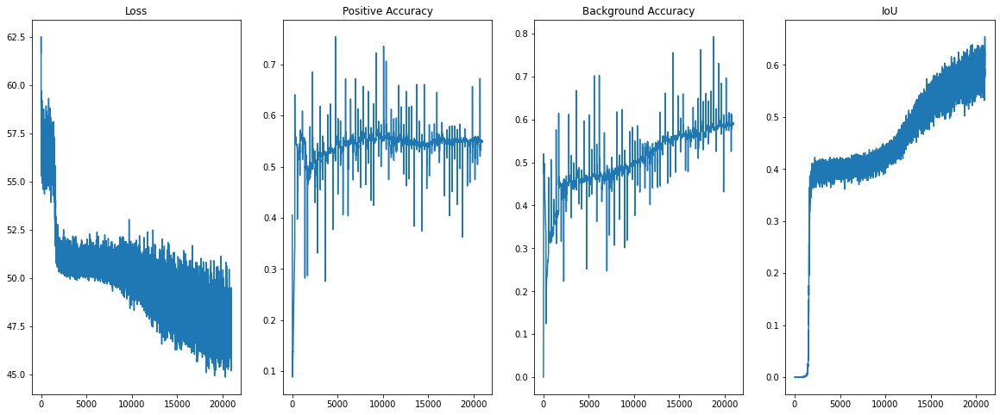

In [ ]:
plot_metrics(loss_results, positive_accuracy_results, background_accuracy_results, iou_results)

In [ ]:
train(50)

 Epoch 01/50 | Step 280/280 | Loss: 48.03116 | Positive Accuracy: 0.5514 | Background Accuracy: 0.5911 | iou: 0.6052 | Epoch Time: 167.36
 Epoch 02/50 | Step 280/280 | Loss: 46.91143 | Positive Accuracy: 0.5503 | Background Accuracy: 0.5922 | iou: 0.6025 | Epoch Time: 166.65
 Epoch 03/50 | Step 280/280 | Loss: 46.15863 | Positive Accuracy: 0.5515 | Background Accuracy: 0.5921 | iou: 0.5920 | Epoch Time: 165.36
 Epoch 04/50 | Step 280/280 | Loss: 47.77777 | Positive Accuracy: 0.5514 | Background Accuracy: 0.5910 | iou: 0.6097 | Epoch Time: 168.37
 Epoch 05/50 | Step 280/280 | Loss: 46.53126 | Positive Accuracy: 0.5515 | Background Accuracy: 0.5953 | iou: 0.5989 | Epoch Time: 166.12
 Epoch 06/50 | Step 280/280 | Loss: 46.76963 | Positive Accuracy: 0.5503 | Background Accuracy: 0.5971 | iou: 0.6180 | Epoch Time: 165.47
 Epoch 07/50 | Step 280/280 | Loss: 47.16670 | Positive Accuracy: 0.5529 | Background Accuracy: 0.5962 | iou: 0.5782 | Epoch Time: 168.86
 Epoch 08/50 | Step 280/280 | Loss

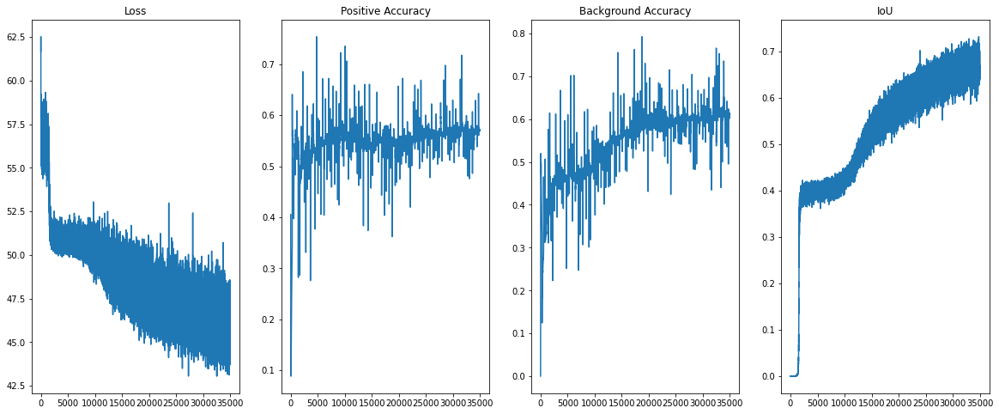

In [ ]:
plot_metrics(loss_results, positive_accuracy_results, background_accuracy_results, iou_results)

In [ ]:
train(25)

 Epoch 01/25 | Step 280/280 | Loss: 46.45255 | Positive Accuracy: 0.5724 | Background Accuracy: 0.6129 | iou: 0.6314 | Epoch Time: 165.47
 Epoch 02/25 | Step 280/280 | Loss: 45.93813 | Positive Accuracy: 0.5713 | Background Accuracy: 0.6169 | iou: 0.6805 | Epoch Time: 164.55
 Epoch 03/25 | Step 280/280 | Loss: 45.77276 | Positive Accuracy: 0.5726 | Background Accuracy: 0.6161 | iou: 0.7051 | Epoch Time: 164.45
 Epoch 04/25 | Step 280/280 | Loss: 44.03539 | Positive Accuracy: 0.5717 | Background Accuracy: 0.6152 | iou: 0.6945 | Epoch Time: 165.10
 Epoch 05/25 | Step 280/280 | Loss: 44.44044 | Positive Accuracy: 0.5706 | Background Accuracy: 0.6201 | iou: 0.6624 | Epoch Time: 166.38
 Epoch 06/25 | Step 280/280 | Loss: 43.85329 | Positive Accuracy: 0.5720 | Background Accuracy: 0.6189 | iou: 0.7159 | Epoch Time: 165.79
 Epoch 07/25 | Step 280/280 | Loss: 44.84792 | Positive Accuracy: 0.5717 | Background Accuracy: 0.6198 | iou: 0.6920 | Epoch Time: 166.25
 Epoch 08/25 | Step 280/280 | Loss

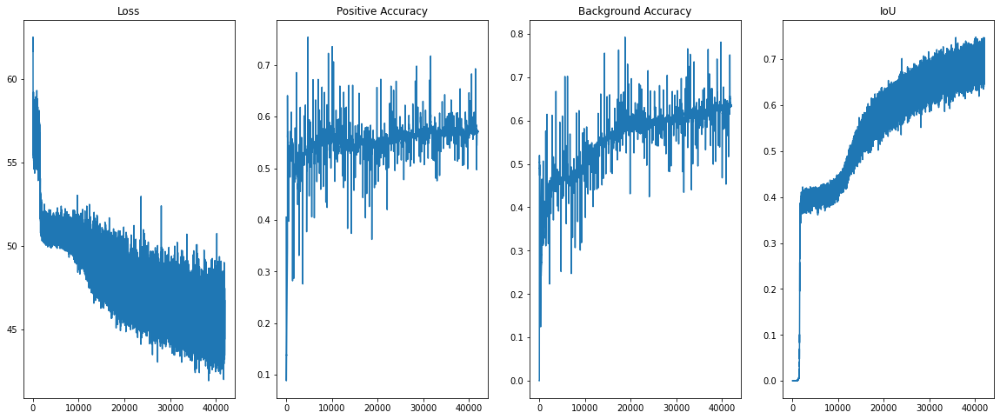

In [ ]:
plot_metrics(loss_results, positive_accuracy_results, background_accuracy_results, iou_results)

In [ ]:
train(25)

 Epoch 01/25 | Step 280/280 | Loss: 47.78605 | Positive Accuracy: 0.5710 | Background Accuracy: 0.6344 | iou: 0.7190 | Epoch Time: 156.86
 Epoch 02/25 | Step 280/280 | Loss: 44.84045 | Positive Accuracy: 0.5705 | Background Accuracy: 0.6363 | iou: 0.7291 | Epoch Time: 151.01
 Epoch 03/25 | Step 280/280 | Loss: 45.85365 | Positive Accuracy: 0.5732 | Background Accuracy: 0.6362 | iou: 0.7184 | Epoch Time: 151.74
 Epoch 04/25 | Step 280/280 | Loss: 45.76762 | Positive Accuracy: 0.5727 | Background Accuracy: 0.6378 | iou: 0.7012 | Epoch Time: 150.56
 Epoch 05/25 | Step 280/280 | Loss: 46.41618 | Positive Accuracy: 0.5713 | Background Accuracy: 0.6398 | iou: 0.7259 | Epoch Time: 150.98
 Epoch 06/25 | Step 280/280 | Loss: 45.42701 | Positive Accuracy: 0.5715 | Background Accuracy: 0.6402 | iou: 0.6772 | Epoch Time: 150.81
 Epoch 07/25 | Step 280/280 | Loss: 44.37547 | Positive Accuracy: 0.5722 | Background Accuracy: 0.6423 | iou: 0.7326 | Epoch Time: 150.43
 Epoch 08/25 | Step 280/280 | Loss

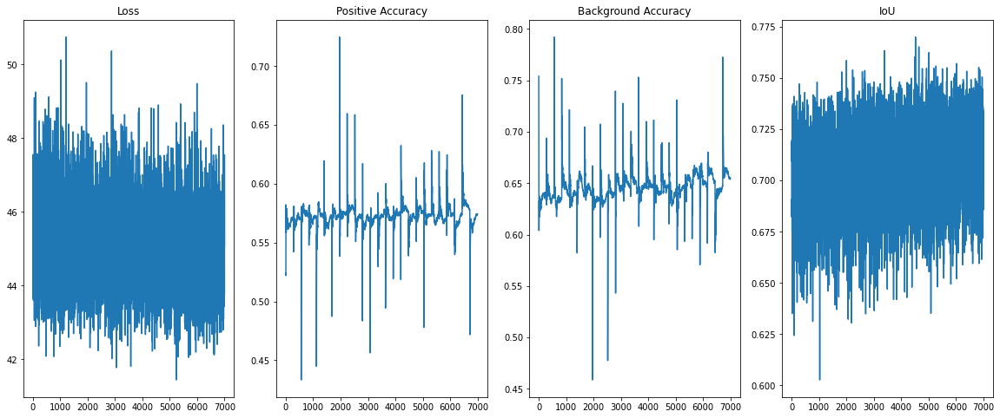

In [ ]:
plot_metrics(loss_results, positive_accuracy_results, background_accuracy_results, iou_results)

In [ ]:
train(25)

 Epoch 01/25 | Step 280/280 | Loss: 44.84505 | Positive Accuracy: 0.5681 | Background Accuracy: 0.6639 | iou: 0.7014 | Epoch Time: 149.06
 Epoch 02/25 | Step 280/280 | Loss: 46.44100 | Positive Accuracy: 0.5699 | Background Accuracy: 0.6579 | iou: 0.7131 | Epoch Time: 149.27
 Epoch 03/25 | Step 280/280 | Loss: 44.20023 | Positive Accuracy: 0.5751 | Background Accuracy: 0.6508 | iou: 0.6968 | Epoch Time: 148.88
 Epoch 04/25 | Step 280/280 | Loss: 44.82775 | Positive Accuracy: 0.5726 | Background Accuracy: 0.6554 | iou: 0.7027 | Epoch Time: 149.68
 Epoch 05/25 | Step 280/280 | Loss: 47.07571 | Positive Accuracy: 0.5723 | Background Accuracy: 0.6603 | iou: 0.7329 | Epoch Time: 148.78
 Epoch 06/25 | Step 280/280 | Loss: 43.94078 | Positive Accuracy: 0.5749 | Background Accuracy: 0.6561 | iou: 0.7259 | Epoch Time: 149.04
 Epoch 07/25 | Step 280/280 | Loss: 43.33447 | Positive Accuracy: 0.5712 | Background Accuracy: 0.6621 | iou: 0.7236 | Epoch Time: 149.38
 Epoch 08/25 | Step 280/280 | Loss

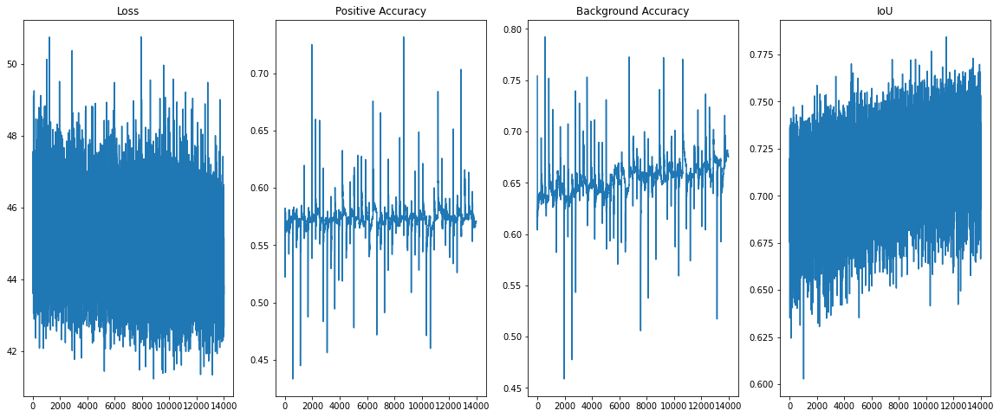

In [ ]:
plot_metrics(loss_results, positive_accuracy_results, background_accuracy_results, iou_results)

In [ ]:
train(epochs)

 Epoch 01/100 | Step 280/280 | Loss: 42.94918 | Positive Accuracy: 0.5743 | Background Accuracy: 0.6661 | iou: 0.7344 | Epoch Time: 173.73
 Epoch 02/100 | Step 280/280 | Loss: 46.36085 | Positive Accuracy: 0.5753 | Background Accuracy: 0.6699 | iou: 0.7235 | Epoch Time: 158.39
 Epoch 03/100 | Step 280/280 | Loss: 44.44824 | Positive Accuracy: 0.5699 | Background Accuracy: 0.6726 | iou: 0.7206 | Epoch Time: 159.86
 Epoch 04/100 | Step 280/280 | Loss: 42.78407 | Positive Accuracy: 0.5720 | Background Accuracy: 0.6713 | iou: 0.7226 | Epoch Time: 158.39
 Epoch 05/100 | Step 280/280 | Loss: 46.18482 | Positive Accuracy: 0.5755 | Background Accuracy: 0.6701 | iou: 0.6997 | Epoch Time: 158.51
 Epoch 06/100 | Step 280/280 | Loss: 43.91394 | Positive Accuracy: 0.5723 | Background Accuracy: 0.6714 | iou: 0.7433 | Epoch Time: 155.06
 Epoch 07/100 | Step 280/280 | Loss: 42.28256 | Positive Accuracy: 0.5740 | Background Accuracy: 0.6713 | iou: 0.7279 | Epoch Time: 155.66
 Epoch 08/100 | Step 280/28

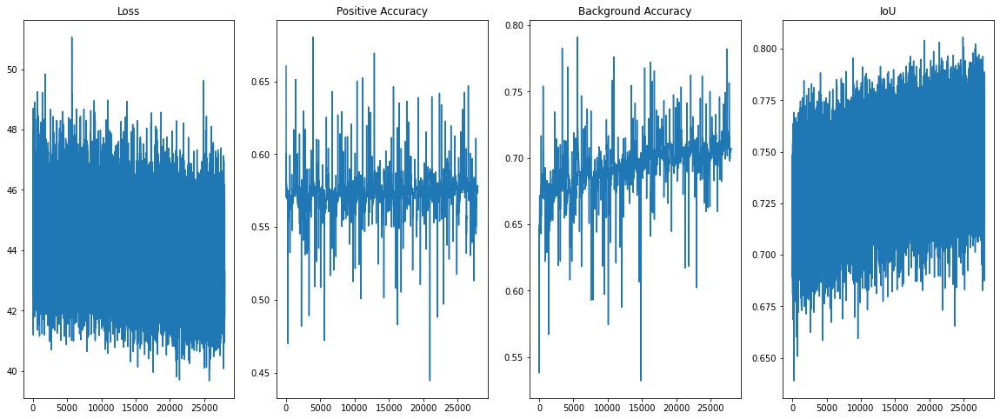

In [ ]:
plot_metrics(loss_results, positive_accuracy_results, background_accuracy_results, iou_results)

In [ ]:
train(50)

 Epoch 01/50 | Step 280/280 | Loss: 43.87264 | Positive Accuracy: 0.5752 | Background Accuracy: 0.7117 | iou: 0.7112 | Epoch Time: 147.79
 Epoch 02/50 | Step 280/280 | Loss: 44.94607 | Positive Accuracy: 0.5755 | Background Accuracy: 0.7103 | iou: 0.7502 | Epoch Time: 146.84
 Epoch 03/50 | Step 280/280 | Loss: 46.31197 | Positive Accuracy: 0.5786 | Background Accuracy: 0.7045 | iou: 0.7084 | Epoch Time: 146.24
 Epoch 04/50 | Step 280/280 | Loss: 44.17751 | Positive Accuracy: 0.5786 | Background Accuracy: 0.7090 | iou: 0.7577 | Epoch Time: 147.18
 Epoch 05/50 | Step 280/280 | Loss: 44.33523 | Positive Accuracy: 0.5760 | Background Accuracy: 0.7090 | iou: 0.7499 | Epoch Time: 146.45
 Epoch 06/50 | Step 280/280 | Loss: 48.28471 | Positive Accuracy: 0.5771 | Background Accuracy: 0.7102 | iou: 0.7201 | Epoch Time: 147.13
 Epoch 07/50 | Step 280/280 | Loss: 42.63825 | Positive Accuracy: 0.5798 | Background Accuracy: 0.7051 | iou: 0.7711 | Epoch Time: 146.34
 Epoch 08/50 | Step 280/280 | Loss

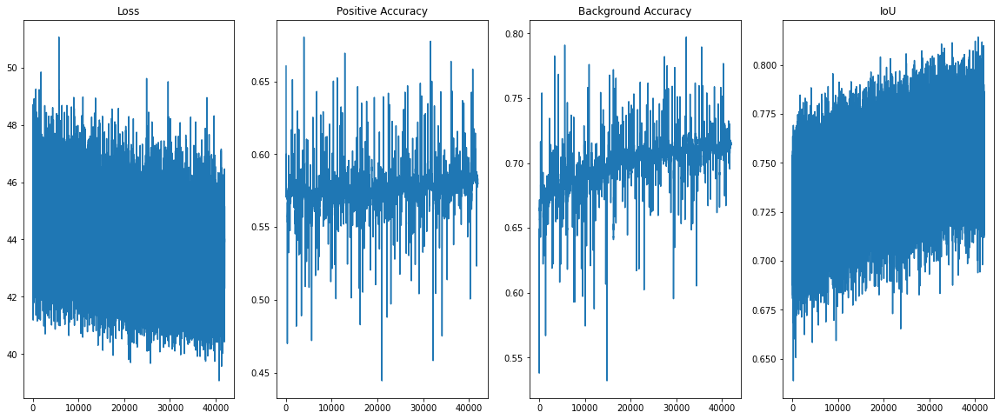

In [ ]:
plot_metrics(loss_results, positive_accuracy_results, background_accuracy_results, iou_results)

In [ ]:
train(25)

 Epoch 01/25 | Step 280/280 | Loss: 41.88206 | Positive Accuracy: 0.5822 | Background Accuracy: 0.7153 | iou: 0.7622 | Epoch Time: 152.59
 Epoch 02/25 | Step 280/280 | Loss: 42.76273 | Positive Accuracy: 0.5813 | Background Accuracy: 0.7160 | iou: 0.7654 | Epoch Time: 151.28
 Epoch 03/25 | Step 280/280 | Loss: 46.23230 | Positive Accuracy: 0.5827 | Background Accuracy: 0.7159 | iou: 0.7739 | Epoch Time: 149.83
 Epoch 04/25 | Step 280/280 | Loss: 44.48265 | Positive Accuracy: 0.5827 | Background Accuracy: 0.7127 | iou: 0.7685 | Epoch Time: 148.62
 Epoch 05/25 | Step 280/280 | Loss: 42.07714 | Positive Accuracy: 0.5815 | Background Accuracy: 0.7162 | iou: 0.7710 | Epoch Time: 148.42
 Epoch 06/25 | Step 280/280 | Loss: 42.11874 | Positive Accuracy: 0.5831 | Background Accuracy: 0.7156 | iou: 0.7775 | Epoch Time: 148.31
 Epoch 07/25 | Step 280/280 | Loss: 46.90857 | Positive Accuracy: 0.5804 | Background Accuracy: 0.7170 | iou: 0.7328 | Epoch Time: 147.02
 Epoch 08/25 | Step 280/280 | Loss

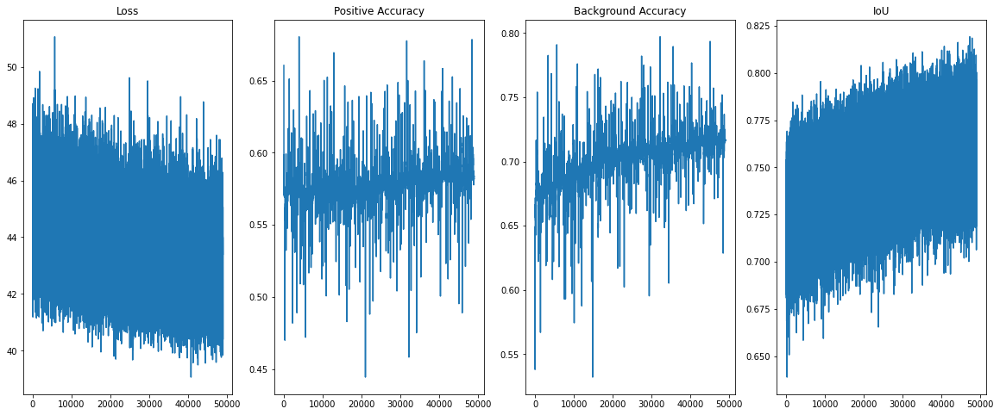

In [ ]:
plot_metrics(loss_results, positive_accuracy_results, background_accuracy_results, iou_results)

In [ ]:
train(epochs)

 Epoch 01/100 | Step 280/280 | Loss: 42.93374 | Positive Accuracy: 0.5828 | Background Accuracy: 0.7171 | iou: 0.7370 | Epoch Time: 178.27
 Epoch 02/100 | Step 280/280 | Loss: 44.85522 | Positive Accuracy: 0.5820 | Background Accuracy: 0.7175 | iou: 0.7563 | Epoch Time: 155.66
 Epoch 03/100 | Step 280/280 | Loss: 43.54738 | Positive Accuracy: 0.5853 | Background Accuracy: 0.7149 | iou: 0.7464 | Epoch Time: 152.12
 Epoch 04/100 | Step 280/280 | Loss: 40.72509 | Positive Accuracy: 0.5824 | Background Accuracy: 0.7180 | iou: 0.7613 | Epoch Time: 151.63
 Epoch 05/100 | Step 280/280 | Loss: 42.46706 | Positive Accuracy: 0.5847 | Background Accuracy: 0.7194 | iou: 0.7598 | Epoch Time: 151.92
 Epoch 06/100 | Step 280/280 | Loss: 43.04785 | Positive Accuracy: 0.5848 | Background Accuracy: 0.7147 | iou: 0.7775 | Epoch Time: 150.63
 Epoch 07/100 | Step 280/280 | Loss: 46.11485 | Positive Accuracy: 0.5847 | Background Accuracy: 0.7170 | iou: 0.7856 | Epoch Time: 150.72
 Epoch 08/100 | Step 280/28

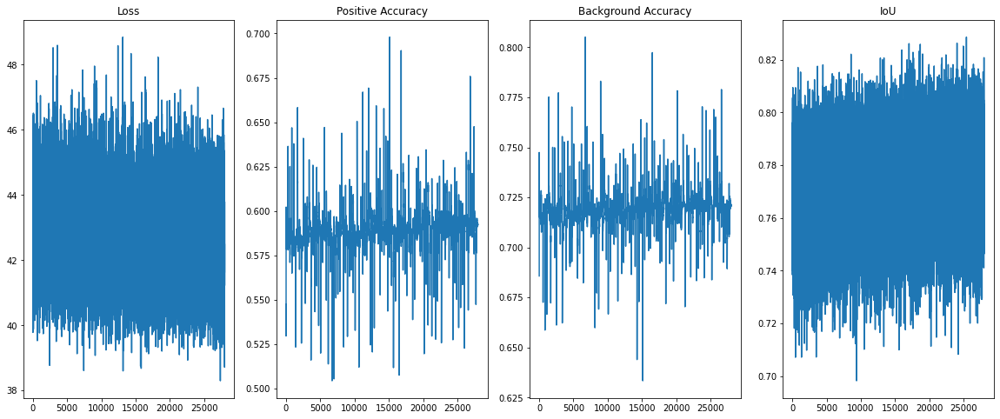

In [ ]:
plot_metrics(loss_results, positive_accuracy_results, background_accuracy_results, iou_results)

In [ ]:
train(25)

 Epoch 01/25 | Step 280/280 | Loss: 41.22511 | Positive Accuracy: 0.5926 | Background Accuracy: 0.7227 | iou: 0.7754 | Epoch Time: 150.22
 Epoch 02/25 | Step 280/280 | Loss: 43.18854 | Positive Accuracy: 0.5919 | Background Accuracy: 0.7218 | iou: 0.7855 | Epoch Time: 149.18
 Epoch 03/25 | Step 280/280 | Loss: 43.85108 | Positive Accuracy: 0.5941 | Background Accuracy: 0.7221 | iou: 0.7708 | Epoch Time: 148.36
 Epoch 04/25 | Step 280/280 | Loss: 43.21051 | Positive Accuracy: 0.5943 | Background Accuracy: 0.7191 | iou: 0.7954 | Epoch Time: 148.33
 Epoch 05/25 | Step 280/280 | Loss: 41.92444 | Positive Accuracy: 0.5921 | Background Accuracy: 0.7220 | iou: 0.7570 | Epoch Time: 147.76
 Epoch 06/25 | Step 280/280 | Loss: 40.09012 | Positive Accuracy: 0.5918 | Background Accuracy: 0.7209 | iou: 0.7784 | Epoch Time: 148.07
 Epoch 07/25 | Step 280/280 | Loss: 44.44400 | Positive Accuracy: 0.5950 | Background Accuracy: 0.7223 | iou: 0.7743 | Epoch Time: 148.00
 Epoch 08/25 | Step 280/280 | Loss

Until here we have 500 epochs

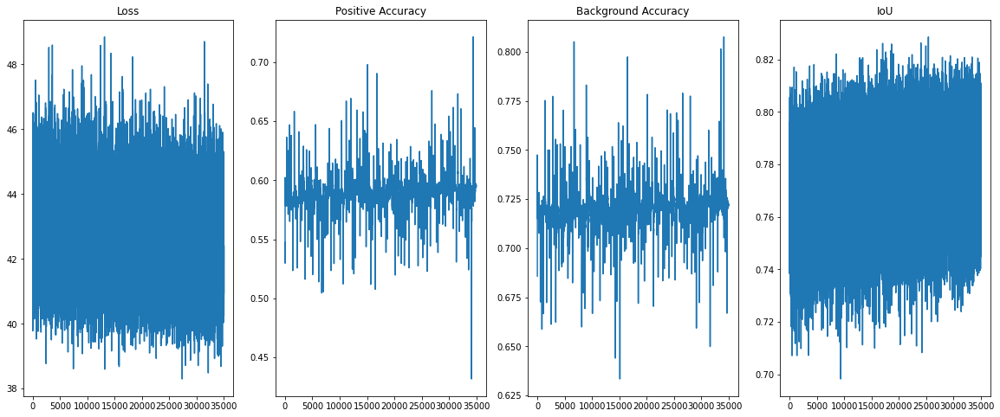

In [ ]:
plot_metrics(loss_results, positive_accuracy_results, background_accuracy_results, iou_results)

In [ ]:
train(25)

 Epoch 01/25 | Step 280/280 | Loss: 41.79655 | Positive Accuracy: 0.5951 | Background Accuracy: 0.7220 | iou: 0.7812 | Epoch Time: 164.32
 Epoch 02/25 | Step 280/280 | Loss: 43.45016 | Positive Accuracy: 0.5939 | Background Accuracy: 0.7232 | iou: 0.7805 | Epoch Time: 164.75
 Epoch 03/25 | Step 280/280 | Loss: 44.10372 | Positive Accuracy: 0.5950 | Background Accuracy: 0.7203 | iou: 0.7876 | Epoch Time: 164.96
 Epoch 04/25 | Step 280/280 | Loss: 43.92294 | Positive Accuracy: 0.5950 | Background Accuracy: 0.7237 | iou: 0.7919 | Epoch Time: 164.76
 Epoch 05/25 | Step 280/280 | Loss: 42.96172 | Positive Accuracy: 0.5955 | Background Accuracy: 0.7222 | iou: 0.7799 | Epoch Time: 165.74
 Epoch 06/25 | Step 280/280 | Loss: 46.17240 | Positive Accuracy: 0.5954 | Background Accuracy: 0.7224 | iou: 0.7410 | Epoch Time: 166.21
 Epoch 07/25 | Step 280/280 | Loss: 41.96951 | Positive Accuracy: 0.5946 | Background Accuracy: 0.7237 | iou: 0.7764 | Epoch Time: 164.85
 Epoch 08/25 | Step 280/280 | Loss

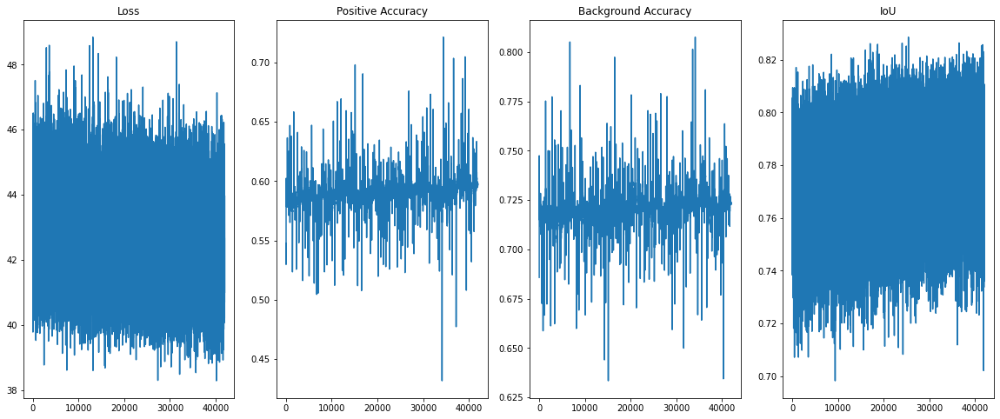

In [ ]:
plot_metrics(loss_results, positive_accuracy_results, background_accuracy_results, iou_results)

In [ ]:
train(25)

 Epoch 01/25 | Step 280/280 | Loss: 43.78136 | Positive Accuracy: 0.5971 | Background Accuracy: 0.7221 | iou: 0.7973 | Epoch Time: 167.35
 Epoch 02/25 | Step 280/280 | Loss: 42.27240 | Positive Accuracy: 0.5963 | Background Accuracy: 0.7229 | iou: 0.7735 | Epoch Time: 166.78
 Epoch 03/25 | Step 280/280 | Loss: 39.86599 | Positive Accuracy: 0.5979 | Background Accuracy: 0.7215 | iou: 0.7825 | Epoch Time: 165.86
 Epoch 04/25 | Step 280/280 | Loss: 42.99673 | Positive Accuracy: 0.5962 | Background Accuracy: 0.7224 | iou: 0.7550 | Epoch Time: 165.84
 Epoch 05/25 | Step 280/280 | Loss: 42.46289 | Positive Accuracy: 0.5975 | Background Accuracy: 0.7212 | iou: 0.7755 | Epoch Time: 166.00
 Epoch 06/25 | Step 280/280 | Loss: 39.39383 | Positive Accuracy: 0.5967 | Background Accuracy: 0.7240 | iou: 0.7966 | Epoch Time: 159.82
 Epoch 07/25 | Step 280/280 | Loss: 40.81150 | Positive Accuracy: 0.5977 | Background Accuracy: 0.7227 | iou: 0.7666 | Epoch Time: 155.31
 Epoch 08/25 | Step 280/280 | Loss

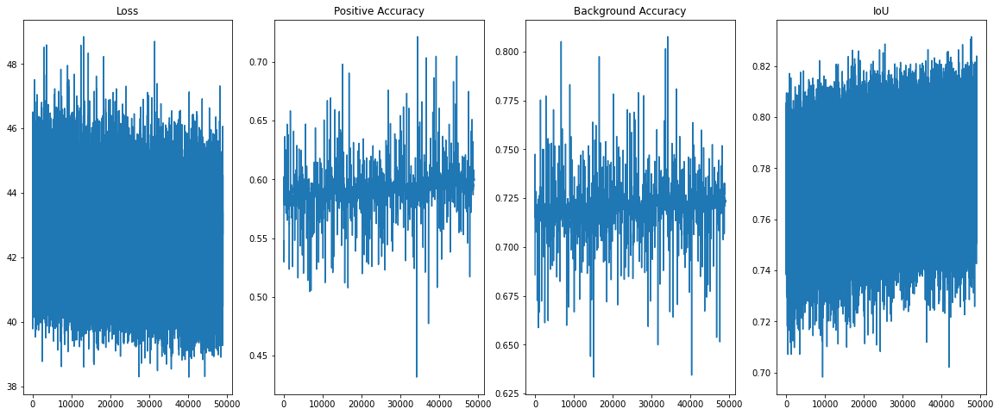

In [ ]:
plot_metrics(loss_results, positive_accuracy_results, background_accuracy_results, iou_results)

In [ ]:
train(50)

 Epoch 01/50 | Step 280/280 | Loss: 42.00723 | Positive Accuracy: 0.5997 | Background Accuracy: 0.7229 | iou: 0.7549 | Epoch Time: 167.77
 Epoch 02/50 | Step 280/280 | Loss: 44.72256 | Positive Accuracy: 0.5985 | Background Accuracy: 0.7230 | iou: 0.8106 | Epoch Time: 154.85
 Epoch 03/50 | Step 280/280 | Loss: 41.34338 | Positive Accuracy: 0.5980 | Background Accuracy: 0.7234 | iou: 0.8261 | Epoch Time: 153.44
 Epoch 04/50 | Step 280/280 | Loss: 42.64861 | Positive Accuracy: 0.5974 | Background Accuracy: 0.7234 | iou: 0.7987 | Epoch Time: 154.30
 Epoch 05/50 | Step 280/280 | Loss: 42.34558 | Positive Accuracy: 0.5981 | Background Accuracy: 0.7241 | iou: 0.7828 | Epoch Time: 152.19
 Epoch 06/50 | Step 280/280 | Loss: 43.57910 | Positive Accuracy: 0.6019 | Background Accuracy: 0.7212 | iou: 0.7617 | Epoch Time: 153.67
 Epoch 07/50 | Step 280/280 | Loss: 42.49703 | Positive Accuracy: 0.5985 | Background Accuracy: 0.7233 | iou: 0.7977 | Epoch Time: 153.27
 Epoch 08/50 | Step 280/280 | Loss

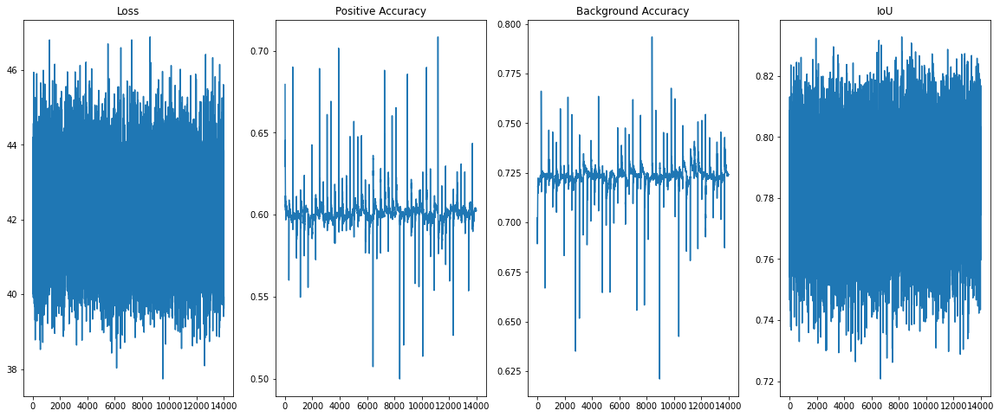

In [ ]:
plot_metrics(loss_results, positive_accuracy_results, background_accuracy_results, iou_results)

In [ ]:
train(25)

 Epoch 01/25 | Step 280/280 | Loss: 42.86448 | Positive Accuracy: 0.6015 | Background Accuracy: 0.7240 | iou: 0.7934 | Epoch Time: 155.19
 Epoch 02/25 | Step 280/280 | Loss: 41.36947 | Positive Accuracy: 0.6025 | Background Accuracy: 0.7239 | iou: 0.7774 | Epoch Time: 150.98
 Epoch 03/25 | Step 280/280 | Loss: 41.32716 | Positive Accuracy: 0.6024 | Background Accuracy: 0.7240 | iou: 0.7979 | Epoch Time: 153.02
 Epoch 04/25 | Step 280/280 | Loss: 41.48723 | Positive Accuracy: 0.6021 | Background Accuracy: 0.7235 | iou: 0.7712 | Epoch Time: 155.16
 Epoch 05/25 | Step 280/280 | Loss: 39.38926 | Positive Accuracy: 0.6022 | Background Accuracy: 0.7237 | iou: 0.7958 | Epoch Time: 157.47
 Epoch 06/25 | Step 280/280 | Loss: 42.80273 | Positive Accuracy: 0.6029 | Background Accuracy: 0.7220 | iou: 0.8007 | Epoch Time: 159.00
 Epoch 07/25 | Step 280/280 | Loss: 42.09575 | Positive Accuracy: 0.6039 | Background Accuracy: 0.7235 | iou: 0.7519 | Epoch Time: 160.13
 Epoch 08/25 | Step 280/280 | Loss

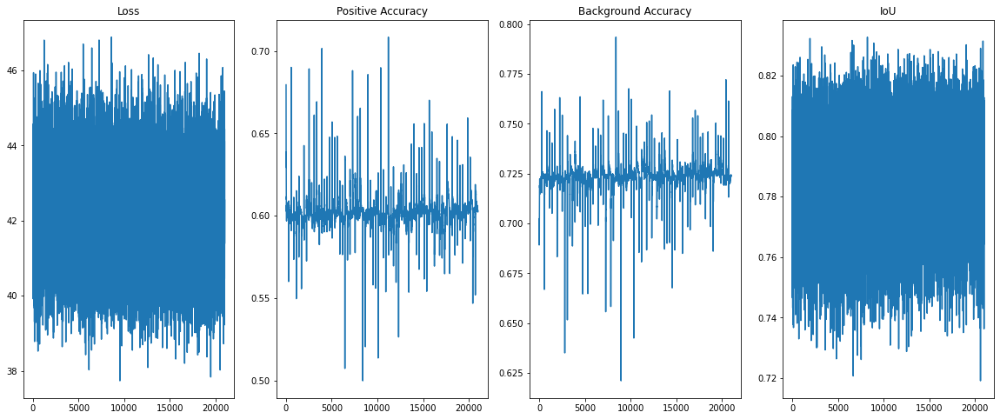

In [ ]:
plot_metrics(loss_results, positive_accuracy_results, background_accuracy_results, iou_results)

In [ ]:
train(25)

 Epoch 01/25 | Step 280/280 | Loss: 42.03741 | Positive Accuracy: 0.6036 | Background Accuracy: 0.7228 | iou: 0.7794 | Epoch Time: 161.98
 Epoch 02/25 | Step 280/280 | Loss: 40.94738 | Positive Accuracy: 0.6028 | Background Accuracy: 0.7244 | iou: 0.7669 | Epoch Time: 161.05
 Epoch 03/25 | Step 280/280 | Loss: 42.68681 | Positive Accuracy: 0.6046 | Background Accuracy: 0.7238 | iou: 0.7677 | Epoch Time: 159.96
 Epoch 04/25 | Step 280/280 | Loss: 42.57921 | Positive Accuracy: 0.6031 | Background Accuracy: 0.7236 | iou: 0.7980 | Epoch Time: 159.35
 Epoch 05/25 | Step 280/280 | Loss: 41.49063 | Positive Accuracy: 0.6030 | Background Accuracy: 0.7252 | iou: 0.8012 | Epoch Time: 160.19
 Epoch 06/25 | Step 280/280 | Loss: 40.29355 | Positive Accuracy: 0.6064 | Background Accuracy: 0.7228 | iou: 0.7934 | Epoch Time: 160.31
 Epoch 07/25 | Step 280/280 | Loss: 40.95493 | Positive Accuracy: 0.6018 | Background Accuracy: 0.7255 | iou: 0.8063 | Epoch Time: 161.34
 Epoch 08/25 | Step 280/280 | Loss

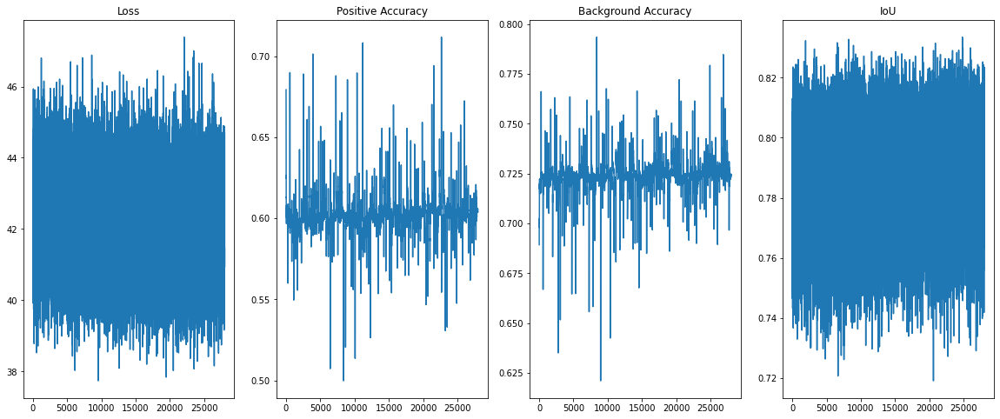

In [ ]:
plot_metrics(loss_results, positive_accuracy_results, background_accuracy_results, iou_results)

In [ ]:
train(epochs)

 Epoch 01/100 | Step 280/280 | Loss: 42.66653 | Positive Accuracy: 0.6031 | Background Accuracy: 0.7251 | iou: 0.7788 | Epoch Time: 176.96
 Epoch 02/100 | Step 280/280 | Loss: 41.91167 | Positive Accuracy: 0.6044 | Background Accuracy: 0.7254 | iou: 0.7597 | Epoch Time: 161.97
 Epoch 03/100 | Step 280/280 | Loss: 42.80202 | Positive Accuracy: 0.6036 | Background Accuracy: 0.7251 | iou: 0.7344 | Epoch Time: 160.31
 Epoch 04/100 | Step 280/280 | Loss: 43.24415 | Positive Accuracy: 0.6059 | Background Accuracy: 0.7232 | iou: 0.8081 | Epoch Time: 158.85
 Epoch 05/100 | Step 280/280 | Loss: 41.70285 | Positive Accuracy: 0.6047 | Background Accuracy: 0.7258 | iou: 0.8161 | Epoch Time: 158.91
 Epoch 06/100 | Step 280/280 | Loss: 41.01480 | Positive Accuracy: 0.6051 | Background Accuracy: 0.7244 | iou: 0.7907 | Epoch Time: 157.95
 Epoch 07/100 | Step 280/280 | Loss: 42.22222 | Positive Accuracy: 0.6053 | Background Accuracy: 0.7246 | iou: 0.7924 | Epoch Time: 156.10
 Epoch 08/100 | Step 280/28

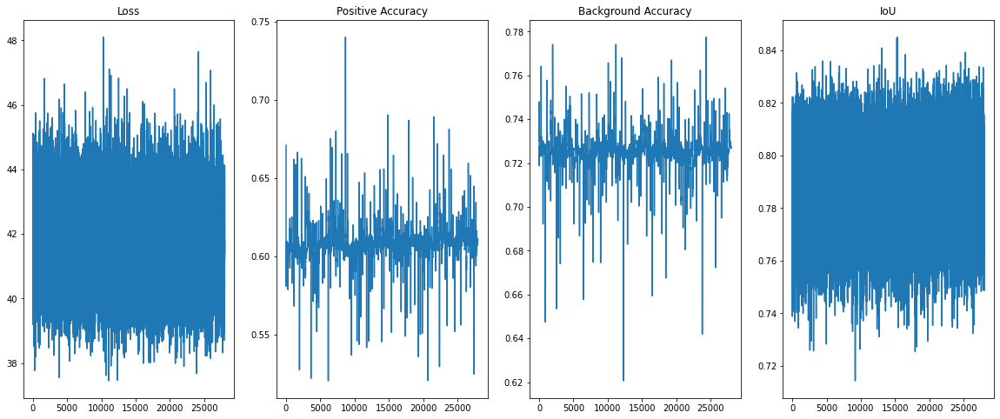

In [ ]:
plot_metrics(loss_results, positive_accuracy_results, background_accuracy_results, iou_results)

In [ ]:
train(50)

 Epoch 01/50 | Step 280/280 | Loss: 41.21128 | Positive Accuracy: 0.6113 | Background Accuracy: 0.7267 | iou: 0.8000 | Epoch Time: 152.31
 Epoch 02/50 | Step 280/280 | Loss: 41.92251 | Positive Accuracy: 0.6094 | Background Accuracy: 0.7270 | iou: 0.7911 | Epoch Time: 151.71
 Epoch 03/50 | Step 280/280 | Loss: 41.37965 | Positive Accuracy: 0.6117 | Background Accuracy: 0.7272 | iou: 0.7867 | Epoch Time: 151.55
 Epoch 04/50 | Step 280/280 | Loss: 42.16139 | Positive Accuracy: 0.6096 | Background Accuracy: 0.7260 | iou: 0.7652 | Epoch Time: 150.68
 Epoch 05/50 | Step 280/280 | Loss: 40.59897 | Positive Accuracy: 0.6106 | Background Accuracy: 0.7272 | iou: 0.8040 | Epoch Time: 151.27
 Epoch 06/50 | Step 280/280 | Loss: 42.40203 | Positive Accuracy: 0.6117 | Background Accuracy: 0.7256 | iou: 0.7585 | Epoch Time: 149.61
 Epoch 07/50 | Step 280/280 | Loss: 41.61453 | Positive Accuracy: 0.6098 | Background Accuracy: 0.7268 | iou: 0.7959 | Epoch Time: 151.05
 Epoch 08/50 | Step 280/280 | Loss

In [ ]:
train(25)

 Epoch 01/25 | Step 280/280 | Loss: 40.23594 | Positive Accuracy: 0.6137 | Background Accuracy: 0.7265 | iou: 0.7902 | Epoch Time: 149.06
 Epoch 02/25 | Step 280/280 | Loss: 41.59084 | Positive Accuracy: 0.6114 | Background Accuracy: 0.7270 | iou: 0.7603 | Epoch Time: 149.43
 Epoch 03/25 | Step 280/280 | Loss: 43.69992 | Positive Accuracy: 0.6134 | Background Accuracy: 0.7268 | iou: 0.8092 | Epoch Time: 148.97
 Epoch 04/25 | Step 280/280 | Loss: 44.55357 | Positive Accuracy: 0.6127 | Background Accuracy: 0.7273 | iou: 0.7674 | Epoch Time: 148.88
 Epoch 05/25 | Step 280/280 | Loss: 40.75370 | Positive Accuracy: 0.6128 | Background Accuracy: 0.7271 | iou: 0.7977 | Epoch Time: 149.15
 Epoch 06/25 | Step 280/280 | Loss: 41.71478 | Positive Accuracy: 0.6127 | Background Accuracy: 0.7273 | iou: 0.8092 | Epoch Time: 149.20
 Epoch 07/25 | Step 280/280 | Loss: 41.65265 | Positive Accuracy: 0.6134 | Background Accuracy: 0.7257 | iou: 0.7907 | Epoch Time: 149.09
 Epoch 08/25 | Step 280/280 | Loss

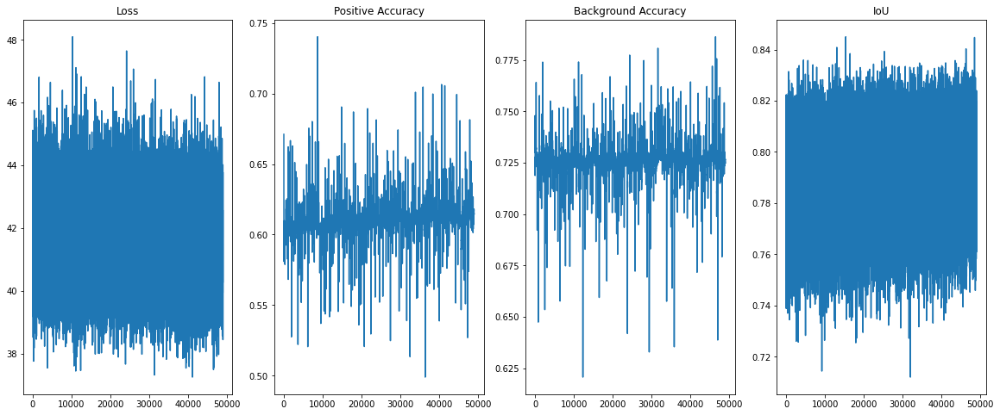

In [ ]:
plot_metrics(loss_results, positive_accuracy_results, background_accuracy_results, iou_results)

## CoreML

In [ ]:
!pip install --upgrade coremltools

In [ ]:
import coremltools as ct 

In [ ]:
for image_paths, imgs, big_anchors, small_anchors in test_generator:
  break

In [ ]:
model.predict(imgs[0:1]) # IMPORTANT predict with shape 1

In [ ]:
coreml_model = ct.convert(model, inputs=[ct.ImageType(scale=1/255.0)])

Translating MIL ==> MLModel Ops: 100%|██████████| 578/578 [00:00<00:00, 18248.05 ops/s]


In [ ]:
coreml_model.save("Face500.mlmodel")

In [ ]:
# import coremltools.proto.FeatureTypes_pb2 as ft

In [ ]:
# spec = ct.utils.load_spec("Face500.mlmodel")

# input = spec.description.input[0]
# input.type.imageType.colorSpace = ft.ImageFeatureType.RGB
# input.type.imageType.height = 128
# input.type.imageType.width = 128

# ct.utils.save_spec(spec,"Face500I.mlmodel")

# save

In [ ]:
for imgs, big_anchors, small_anchors, _, _ in train_generator: # train_generator
  model.predict(imgs)
  break

In [ ]:
!mkdir saved_model

In [ ]:
model.save('saved_model/face_model_500')

INFO:tensorflow:Assets written to: saved_model/face_model_500/assets


In [ ]:
# !zip -qr saved_model.zip saved_model

## TFLite

In [ ]:
converter = tf.lite.TFLiteConverter.from_saved_model('saved_model/face_model_500')

In [ ]:
# new
converter.optimizations = [tf.lite.Optimize.OPTIMIZE_FOR_SIZE]

In [ ]:
tflite_model = converter.convert()

In [ ]:
with open('face_500.tflite', 'wb') as f:
  f.write(tflite_model)

In [ ]:
interpreter = tf.lite.Interpreter(model_path="face_500.tflite")

In [ ]:
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

In [ ]:
print("== Input details ==")
print("shape:", input_details[0]['shape'])
print("type:", input_details[0]['dtype'])
print("\n== Output details ==")
print("shape:", output_details[0]['shape'])
print("type:", output_details[0]['dtype'])
print("type:", output_details[1]['shape'])

== Input details ==
shape: [  1 128 128   3]
type: <class 'numpy.float32'>

== Output details ==
shape: [1 1 1]
type: <class 'numpy.float32'>
type: [1 1 4]


In [ ]:
interpreter.resize_tensor_input(input_details[0]['index'], (32, 128, 128, 3)) # change input so we can use a batch of images
interpreter.resize_tensor_input(output_details[0]['index'], (32, 896, 1))
interpreter.resize_tensor_input(output_details[1]['index'], (32, 896, 4))
interpreter.allocate_tensors()

In [ ]:
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

In [ ]:
print("shape:", input_details[0]['shape'])
print("shape:", output_details[0]['shape'])
print("shape:", output_details[1]['shape'])

shape: [ 32 128 128   3]
shape: [ 32 896   1]
shape: [ 32 896   4]


In [ ]:
iou_test_metric = 0
class_test_metric = 0
batch_number = 1
extra_faces_list = []

In [ ]:
for image_paths, imgs, big_anchors, small_anchors in test_generator:

  # error when the batch is not 32
  interpreter.set_tensor(input_details[0]['index'], imgs)
  interpreter.invoke()
  class_predictions = interpreter.get_tensor(output_details[0]['index'])
  box_predictions = interpreter.get_tensor(output_details[1]['index'])

  batch_iou, class_scores, extra_faces_paths = get_model_metrics(big_anchors, small_anchors, class_predictions, box_predictions, reference_anchors, image_paths)

  iou_test_metric += batch_iou
  class_test_metric += class_scores
  extra_faces_list.extend(extra_faces_paths)

  batch_number += 1

In [ ]:
iou_test_metric / batch_number, class_test_metric / batch_number

(0.5385634387291175, 0.5078631543524975)

In [ ]:
def get_tflite_boxes(big_anchors, small_anchors, reference_anchors, anchor_predictions, class_predictions):
  B = big_anchors.shape[0]
  list_big_anchors = tf.reshape(big_anchors, (B, -1, 5))
  list_small_anchors = tf.reshape(small_anchors, (B, -1, 5))

  list_true_anchors = tf.concat([list_small_anchors, list_big_anchors], axis=1) # shape (B, 320, 5)

  true_classes = list_true_anchors[:, :, :1] # shape (B, 320, 1)
  true_coords = list_true_anchors[:, :, 1:] # shape (B, 320, 1)

  output_detections, _ = filter_true_boxes(true_classes, true_coords, reference_anchors)
  predicted_output_detections, _ = filter_boxes(class_predictions, anchor_predictions, reference_anchors)

  return output_detections, predicted_output_detections

In [ ]:
output_detections, predicted_output_detections = get_tflite_boxes(big_anchors, small_anchors, reference_anchors, box_predictions, class_predictions)

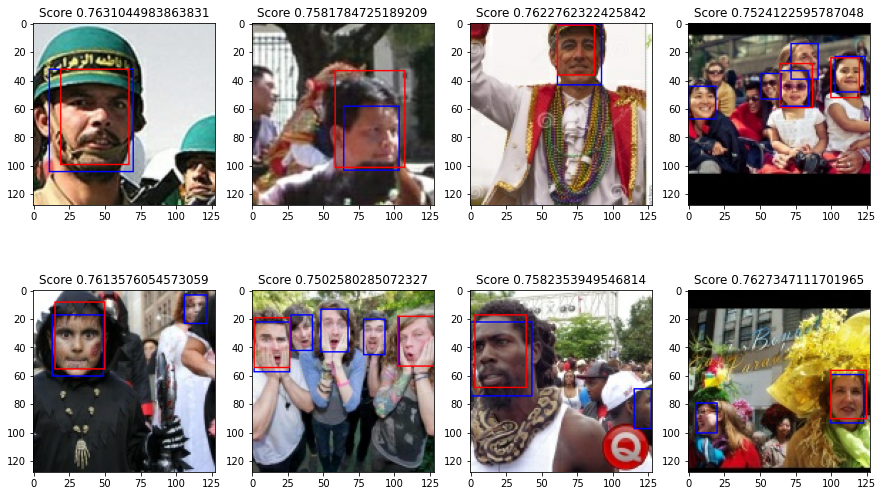

In [ ]:
test_model(output_detections[0:8], predicted_output_detections[0:8], imgs[0:8])

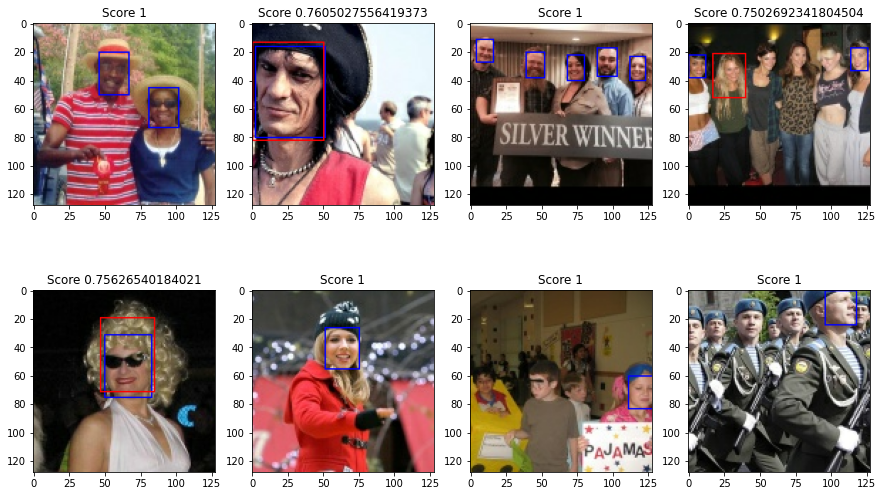

In [ ]:
test_model(output_detections[8:16], predicted_output_detections[8:16], imgs[8:16])

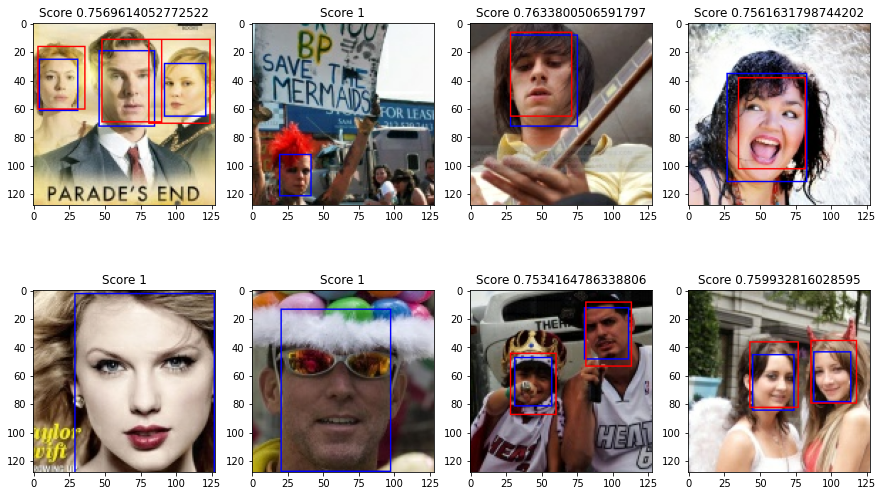

In [ ]:
test_model(output_detections[16:24], predicted_output_detections[16:24], imgs[16:24])

## Filter Boxes

In [ ]:
def filter_boxes(class_predictions, anchor_predictions, reference_anchors, scale=128):
  # class_predictions # B, 896, 1
  # anchor_predictions # B, 896, 4

  x_center = reference_anchors[:, 0:1] + (anchor_predictions[..., 0:1] / scale) # 8, 896, 1
  y_center = reference_anchors[:, 1:2] + (anchor_predictions[..., 1:2] / scale) # 8, 896, 1

  w = anchor_predictions[..., 2:3] / scale # B, 896, 1
  h = anchor_predictions[..., 3:4] / scale # B, 896, 1

  y_min = y_center - h / 2.  # ymin
  x_min = x_center - w / 2.  # xmin
  y_max = y_center + h / 2.  # ymax
  x_max = x_center + w / 2.  # xmax

  offset_boxes = tf.concat([x_min, y_min, x_max, y_max], axis=-1) # B, 896, 4

  class_predictions = tf.squeeze(class_predictions, axis=-1)

  mask = class_predictions >= 0.75 # 0.75 B, 896

  final_detections = [] # final shape B, num_image_detections, 5 where num_image_detections can vary by image

  for index, image_detections in enumerate(mask): # each 896 for every image
    num_image_detections = tf.keras.backend.sum(tf.dtypes.cast(image_detections, tf.int32))

    if num_image_detections == 0:
      final_detections.append([])
    else:
      filtered_boxes = tf.boolean_mask(offset_boxes[index], image_detections)
      filtered_scores = tf.boolean_mask(class_predictions[index], image_detections)

      final_detections.append(tf.concat([tf.expand_dims(filtered_scores, axis=-1), filtered_boxes], axis=-1)) # num_image_detections, 5

  output_detections = []

  for image_detections in final_detections: # for each image in batch B
    # num_image_detections, 5
    if image_detections == []:
      output_detections.append([])
      continue

    remaining = tf.argsort(image_detections[:, 0], axis=0, direction='DESCENDING') # num_image_detections

    faces = []

    while remaining.shape[0] > 0:
      detection = image_detections[remaining[0]]
      first_box = detection[1:] # 1, 4
      other_boxes = tf.gather(image_detections, remaining)[:, 1:] # 4, 4

      ious = mean_iou(np.array(first_box) * 128.0, np.array(other_boxes) * 128.0, return_mean=False) # num_image_detections

      overlapping = tf.boolean_mask(remaining, ious > 0.3)
      remaining = tf.boolean_mask(remaining, ious <= 0.3) # When all false, returns shape 0
      # The remaining boxes should belong to a different face

      if overlapping.shape[0] > 1:
        overlapping_boxes = tf.gather(image_detections, overlapping)
        coordinates = overlapping_boxes[:, 1:] # overlapping, 4
        scores = overlapping_boxes[:, 0:1] # overlapping, 1
        total_score = tf.keras.backend.sum(scores)
        
        weighted_boxes = tf.keras.backend.sum((coordinates * scores), axis=0) / total_score # overlapping, 4
        weighted_score = total_score / overlapping.shape[0] # overlapping, 1

        weighted_score = tf.reshape(weighted_score, (1,))

        weighted_detection = tf.concat([weighted_score, weighted_boxes], axis=0) # overlapping, 5

        faces.append(weighted_detection)

      else:
        faces.append(detection)
      
    output_detections.append(faces)

  return output_detections, final_detections

In [ ]:
def filter_true_boxes(class_predictions, anchor_predictions, reference_anchors, scale=128):
  # class_predictions # B, 320, 1
  # anchor_predictions # B, 320, 4

  offset_boxes = anchor_predictions
  class_predictions = tf.squeeze(class_predictions, axis=-1)
  mask = class_predictions >= 0.75 # B, 320

  final_detections = [] # final shape B, num_image_detections, 5 where num_image_detections can vary by image

  for index, image_detections in enumerate(mask): # each 320 for every image
    num_image_detections = tf.keras.backend.sum(tf.dtypes.cast(image_detections, tf.int32))

    if num_image_detections == 0:
      final_detections.append([])
    else:
      filtered_boxes = tf.boolean_mask(offset_boxes[index], image_detections)
      filtered_scores = tf.boolean_mask(class_predictions[index], image_detections)

      final_detections.append(tf.concat([tf.expand_dims(filtered_scores, axis=-1), filtered_boxes], axis=-1)) # num_image_detections, 5

  output_detections = []

  for image_detections in final_detections: # for each image in batch B
    # num_image_detections, 5
    if image_detections == []:
      output_detections.append([])
      continue

    remaining = tf.argsort(image_detections[:, 0], axis=0, direction='DESCENDING') # num_image_detections

    faces = []

    while remaining.shape[0] > 0:
      detection = image_detections[remaining[0]]
      first_box = detection[1:] # 1, 4
      other_boxes = tf.gather(image_detections, remaining)[:, 1:] # 4, 4

      ious = mean_iou(np.array(first_box) * 128.0, np.array(other_boxes) * 128.0, return_mean=False) # num_image_detections

      overlapping = tf.boolean_mask(remaining, ious > 0.8)
      remaining = tf.boolean_mask(remaining, ious <= 0.8) # When all false, returns shape 0
      # The remaining boxes should belong to a different face

      if overlapping.shape[0] > 1:
        overlapping_boxes = tf.gather(image_detections, overlapping)
        coordinates = overlapping_boxes[:, 1:] # overlapping, 4
        scores = overlapping_boxes[:, 0:1] # overlapping, 1
        total_score = tf.keras.backend.sum(scores)
        
        weighted_boxes = tf.keras.backend.sum((coordinates * scores), axis=0) / total_score # overlapping, 4
        weighted_score = total_score / overlapping.shape[0] # overlapping, 1

        weighted_score = tf.reshape(weighted_score, (1,))

        weighted_detection = tf.concat([weighted_score, weighted_boxes], axis=0) # overlapping, 5

        faces.append(weighted_detection)

      else:
        faces.append(detection)
      
    output_detections.append(faces)

  return output_detections, final_detections

## Model Metrics

In [ ]:
def get_model_metrics(big_anchors, small_anchors, class_predictions, anchor_predictions, reference_anchors, image_paths, batch_size=32):
  B = big_anchors.shape[0]
  list_big_anchors = tf.reshape(big_anchors, (B, -1, 5))
  list_small_anchors = tf.reshape(small_anchors, (B, -1, 5))

  list_true_anchors = tf.concat([list_small_anchors, list_big_anchors], axis=1) # shape (B, 320, 5)

  true_classes = list_true_anchors[:, :, :1] # shape (B, 320, 1)
  true_coords = list_true_anchors[:, :, 1:] # shape (B, 320, 1)

  output_detections, _ = filter_true_boxes(true_classes, true_coords, reference_anchors)
  predicted_output_detections, _ = filter_boxes(class_predictions, anchor_predictions, reference_anchors)

  batch_iou = 0
  class_scores = 0
  extra_faces_paths = []

  for true_boxes, pred_boxes, image_path in zip(output_detections, predicted_output_detections, image_paths): # faces for each image

  # true_boxes = output_detections[3]
  # pred_boxes = predicted_output_detections[3]

    max_length = len(true_boxes)

    if len(pred_boxes) > len(true_boxes):
      # The model detected more faces than the annotated ones
      extra_faces_paths.append(image_path)

    image_iou = 0
    image_class_score = 0

    if true_boxes != [] and pred_boxes != []:
      box_indices = {}
      class_indices = {}

      for true_box in true_boxes:
        # for each true face, let's compute the iou with all the predicted faces
        # to check which one is the correct prediction

        ious = mean_iou(np.array(true_box)[1:] * 128.0, np.array(pred_boxes)[:, 1:] * 128.0, return_mean=False) # num_image_detections
        ious = ious.numpy()
        max_iou = np.argmax(ious)
        max_iou_value = ious[max_iou]

        # if the iou value is greater than 0.3 is highly possible that the predicted box belongs to the current face
        if max_iou_value > 0.3:
          
          if max_iou not in box_indices.keys():
            # each predicted box has an index, when we assign one predicted box to one face we add this index to the list
            box_indices[max_iou] = max_iou_value
            class_indices[max_iou] = np.array(pred_boxes)[max_iou, 0]
            
          else:
            # if we already assigned the predicted box to a face, check if the iou value is greater or smaller, then keep or change the box

            # get the old iou value
            old_iou_value = box_indices[max_iou]

            if max_iou_value > old_iou_value:
              box_indices[max_iou] = max_iou_value
              class_indices[max_iou] = np.array(pred_boxes)[max_iou, 0]

      image_iou += sum(box_indices.values()) / max_length 
      image_class_score += sum(class_indices.values()) / max_length 

    batch_iou += image_iou
    class_scores += image_class_score

  if batch_iou != 0:
    batch_iou = batch_iou / batch_size 
  
  if class_scores != 0:
    class_scores = class_scores / batch_size 

  return batch_iou, class_scores, extra_faces_paths

In [ ]:
iou_test_metric = 0
class_test_metric = 0
batch_number = 1
extra_faces_list = []

In [ ]:
for image_paths, imgs, big_anchors, small_anchors in test_generator:
  anchor_predictions, class_predictions = model.predict(imgs)

  batch_iou, class_scores, extra_faces_paths = get_model_metrics(big_anchors, small_anchors, class_predictions, anchor_predictions, reference_anchors, image_paths)

  iou_test_metric += batch_iou
  class_test_metric += class_scores
  extra_faces_list.extend(extra_faces_paths)

  batch_number += 1

In [ ]:
batch_number

281

In [ ]:
iou_test_metric / batch_number, class_test_metric / batch_number

(0.5416577109600573, 0.510690410411175)

In [ ]:
len(extra_faces_list)

61

In [ ]:
def load_test_image(image_path):
  img = load_image(image_path)
  big_anchor, small_anchor = tf.py_function(get_boxes_from_dictionary, [image_path, False], [tf.float32, tf.float32])

  return image_path, img, big_anchor, small_anchor

In [ ]:
extra_test_dataset = tf.data.Dataset.from_tensor_slices((extra_faces_list))
# test_dataset = test_dataset.shuffle(len(images_paths)) # 
extra_test_dataset = extra_test_dataset.map(load_test_image, num_parallel_calls=tf.data.experimental.AUTOTUNE)
extra_test_generator = extra_test_dataset.batch(61)

In [ ]:
for image_paths, imgs, big_anchors, small_anchors in extra_test_generator:
  break

In [ ]:
output_detections, predicted_output_detections = get_final_boxes(imgs, big_anchors, small_anchors, reference_anchors, model)

In [ ]:
len(output_detections), len(predicted_output_detections)

(61, 61)

In [ ]:
extra_faces_list

[<tf.Tensor: shape=(), dtype=string, numpy=b'created_dataset/set-1-12_Group_Group_12_Group_Group_12_346.jpg'>,
 <tf.Tensor: shape=(), dtype=string, numpy=b'created_dataset/set-1-23_Shoppers_Shoppers_23_559.jpg'>,
 <tf.Tensor: shape=(), dtype=string, numpy=b'created_dataset/set-1-41_Swimming_Swimmer_41_1039.jpg'>,
 <tf.Tensor: shape=(), dtype=string, numpy=b'created_dataset/set-1-9_Press_Conference_Press_Conference_9_389.jpg'>,
 <tf.Tensor: shape=(), dtype=string, numpy=b'created_dataset/set-1-originalPics-2002-07-19-big-img_805.jpg'>,
 <tf.Tensor: shape=(), dtype=string, numpy=b'created_dataset/set-1-originalPics-2002-07-23-big-img_339.jpg'>,
 <tf.Tensor: shape=(), dtype=string, numpy=b'created_dataset/set-1-originalPics-2002-07-23-big-img_9.jpg'>,
 <tf.Tensor: shape=(), dtype=string, numpy=b'created_dataset/set-1-originalPics-2002-07-25-big-img_1051.jpg'>,
 <tf.Tensor: shape=(), dtype=string, numpy=b'created_dataset/set-1-originalPics-2002-07-25-big-img_175.jpg'>,
 <tf.Tensor: shape=(

## False Negatives

In [ ]:
boxes_dict[image_paths[0].numpy().decode('utf-8')] # check how many images have the original images

# The true boxes only contains one face
# But we have 2 in the image

[array([0.29490617, 0.2627346 , 0.57908845, 0.60589814], dtype=float32)]

In [ ]:
boxes_dict[image_paths[1].numpy().decode('utf-8')] # check how many images have the original images

[array([0.23563218, 0.01149425, 0.38649425, 0.22844827], dtype=float32)]

In [ ]:
boxes_dict[image_paths[2].numpy().decode('utf-8')] # check how many images have the original images

[array([0.33807266, 0.13902053, 0.5608215 , 0.36176935], dtype=float32)]

In [ ]:
boxes_dict[image_paths[7].numpy().decode('utf-8')] # check how many images have the original images

# The true boxes contains 2 faces
# But we have 3 in the image

[array([0.24922119, 0.06853583, 0.7507788 , 0.7258567 ], dtype=float32),
 array([0.6479751 , 0.29595014, 1.        , 0.7570093 ], dtype=float32)]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


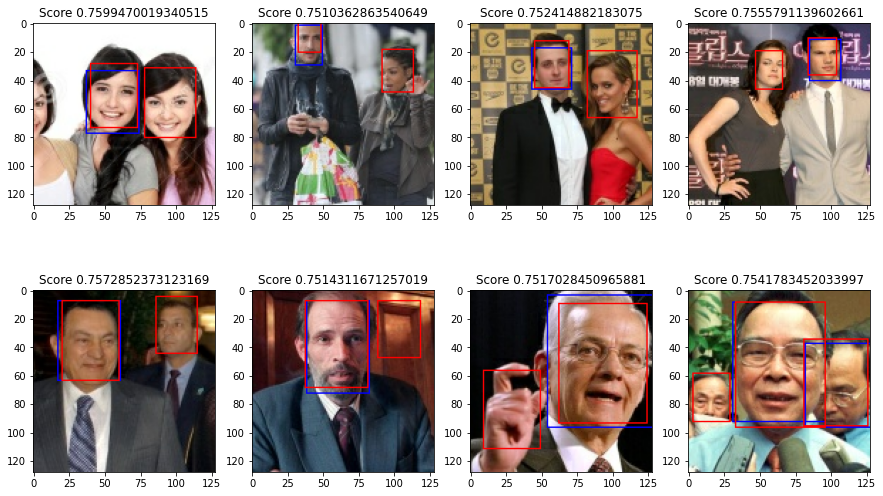

In [ ]:
test_model(output_detections[0:8], predicted_output_detections[0:8], imgs[0:8])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


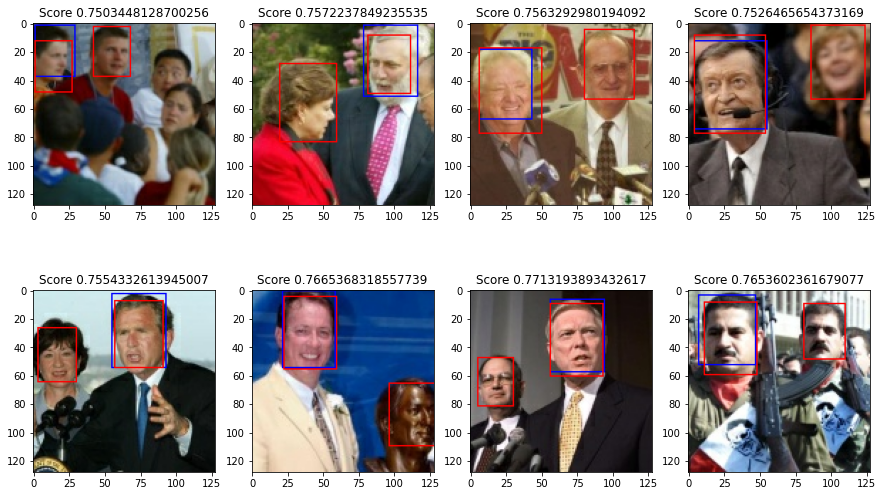

In [ ]:
test_model(output_detections[8:16], predicted_output_detections[8:16], imgs[8:16])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


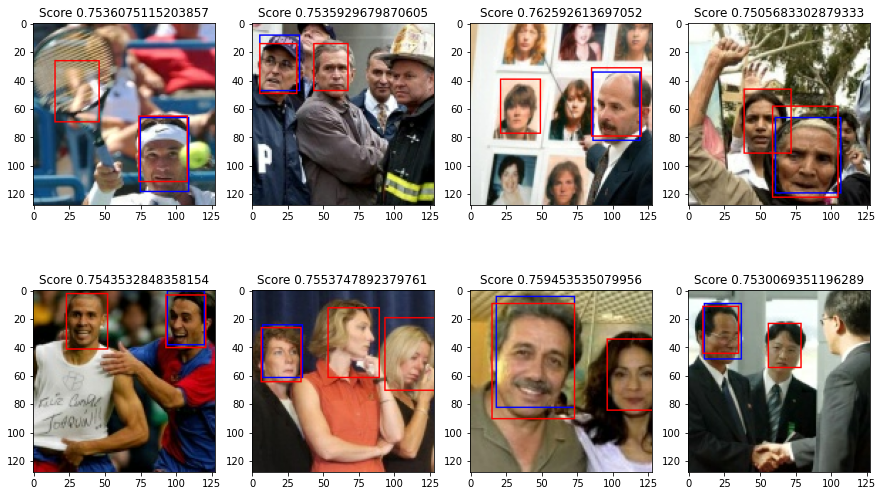

In [ ]:
test_model(output_detections[16:24], predicted_output_detections[16:24], imgs[16:24])

## Test Model

In [ ]:
def plot_images(images, vertical_size, horizontal_size, figsize=(15, 15)):
  vertical_axes = list(range(vertical_size))
  horizontal_axes = list(range(horizontal_size))

  fig, ax = plt.subplots(vertical_size, horizontal_size, figsize=figsize)
  counter = 0

  if vertical_size == 1:
    for x in horizontal_axes:
      ax[x].imshow(images[counter])
      ax[x].set_title('Image {}'.format(counter + 1))
      counter += 1
  else:
    for y in vertical_axes:
      for x in horizontal_axes:
        ax[y, x].imshow(images[counter])
        ax[y, x].set_title('Image {}'.format(counter + 1))
        counter += 1

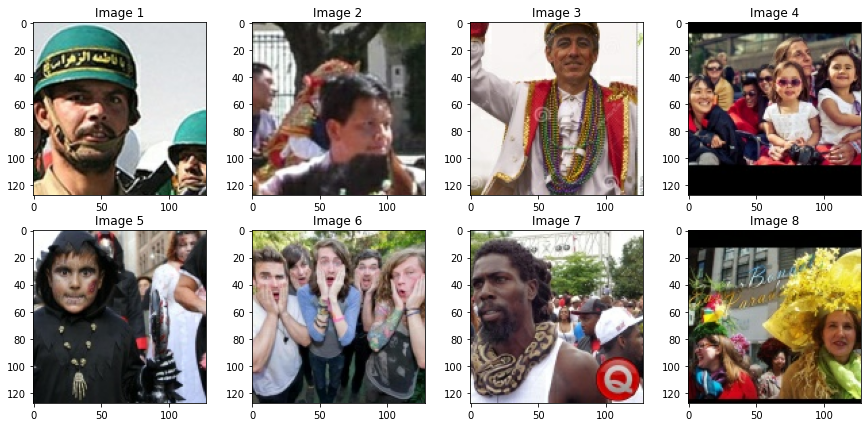

In [ ]:
plot_images(imgs[:8], 2, 4, figsize=(15, 7))

In [ ]:
def get_final_boxes(imgs, big_anchors, small_anchors, reference_anchors, model):
  B = big_anchors.shape[0]
  list_big_anchors = tf.reshape(big_anchors, (B, -1, 5))
  list_small_anchors = tf.reshape(small_anchors, (B, -1, 5))

  list_true_anchors = tf.concat([list_small_anchors, list_big_anchors], axis=1) # shape (B, 320, 5)

  true_classes = list_true_anchors[:, :, :1] # shape (B, 320, 1)
  true_coords = list_true_anchors[:, :, 1:] # shape (B, 320, 1)

  anchor_predictions, class_predictions = model.predict(imgs)

  output_detections, _ = filter_true_boxes(true_classes, true_coords, reference_anchors)
  predicted_output_detections, _ = filter_boxes(class_predictions, anchor_predictions, reference_anchors)

  return output_detections, predicted_output_detections

In [ ]:
def test_model(output_detections, predicted_output_detections, imgs, size=8):
  fig, ax = plt.subplots(2, 4, figsize=(15, 9))

  for index in range(size):
    y = 0 if index < 4 else 1
    x = index if index < 4 else index - 4

    true_boxes = output_detections[index]
    pred_boxes = predicted_output_detections[index]
    img = imgs[index].numpy()

    for box in true_boxes: 
      x1 = int(box[1] * 128)
      y1 = int(box[2] * 128)
      x2 = int(box[3] * 128)
      y2 = int(box[4] * 128)
      color = (0, 0, 255)

      img = cv2.rectangle(img, (x1, y1), (x2, y2), color, 1)

    score = 1

    if pred_boxes != []:
      for box in pred_boxes:
        score = box[0]
        x1 = int(box[1] * 128)
        y1 = int(box[2] * 128)
        x2 = int(box[3] * 128)
        y2 = int(box[4] * 128)
        color = (255, 0, 0)
        img = cv2.rectangle(img, (x1, y1), (x2, y2), color, 1)

    ax[y, x].imshow(img)
    ax[y, x].set_title('Score {}'.format(score))

In [ ]:
for image_paths, imgs, big_anchors, small_anchors in test_generator:
  break

In [ ]:
output_detections, predicted_output_detections = get_final_boxes(imgs, big_anchors, small_anchors, reference_anchors, model)

In [ ]:
len(output_detections), len(predicted_output_detections)

(32, 32)

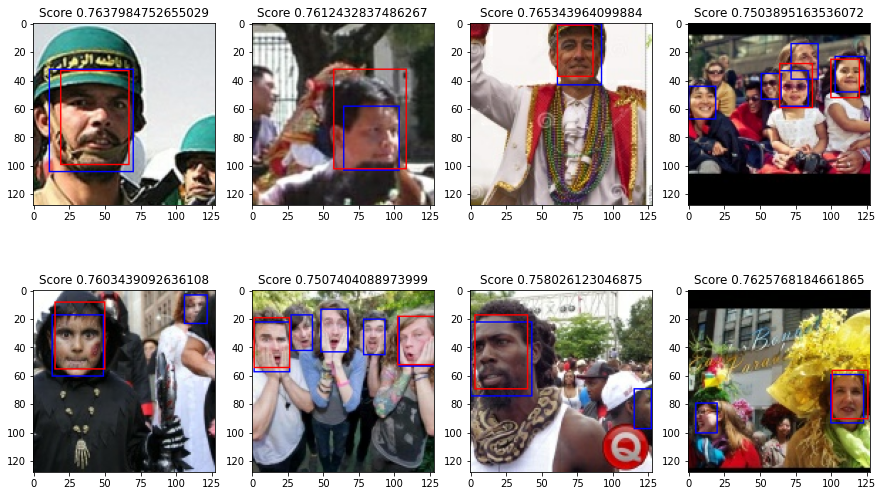

In [ ]:
test_model(output_detections[0:8], predicted_output_detections[0:8], imgs[0:8])

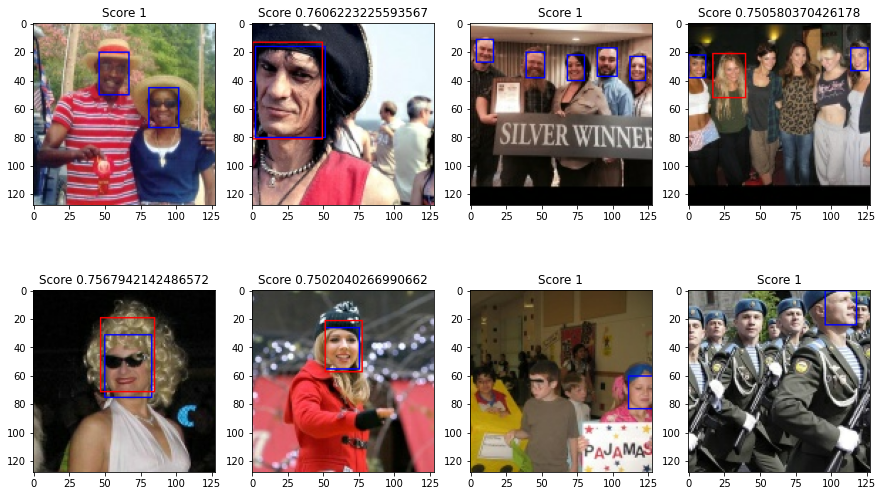

In [ ]:
test_model(output_detections[8:16], predicted_output_detections[8:16], imgs[8:16])

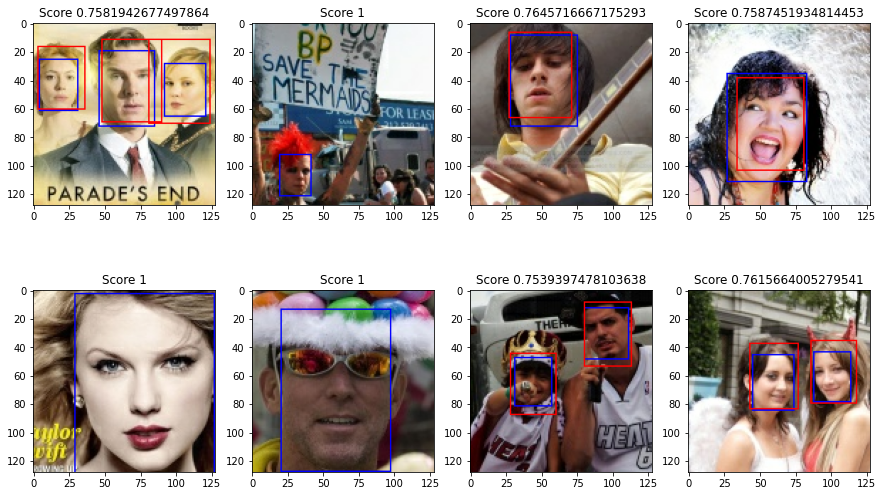

In [ ]:
test_model(output_detections[16:24], predicted_output_detections[16:24], imgs[16:24])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


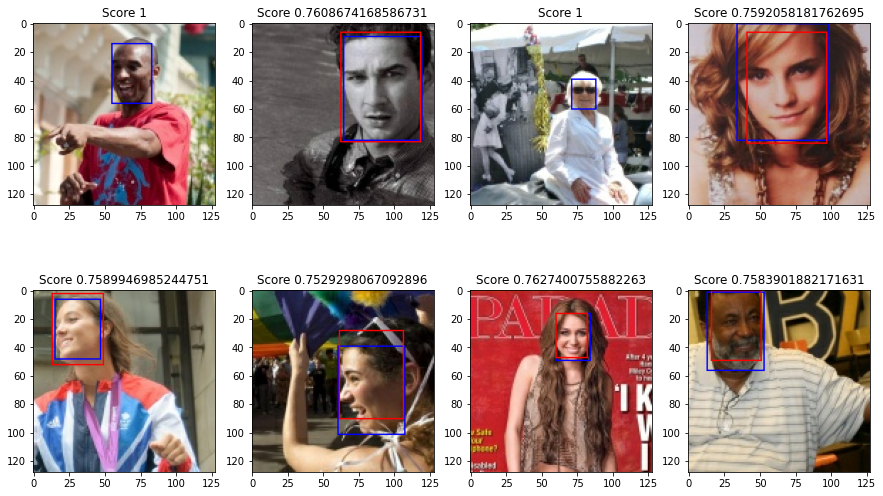

In [ ]:
test_model(output_detections[24:32], predicted_output_detections[24:32], imgs[24:32])

## Optimize Model

In [ ]:
!pip install -q tensorflow-model-optimization

     |████████████████████████████████| 174kB 8.8MB/s 


In [ ]:
import tensorflow_model_optimization as tfmot

In [ ]:
def create_blaze_block(input, filters, layers):
  x = layers[0](input)
  x = layers[2](x)
  x = layers[1](x)
  x = layers[3](x)
  
  padding = filters - input.shape[-1]

  if padding != 0:
    padding_values = [[0, 0], [0, 0], [0, 0], [0, padding]]
    input = tf.pad(input, padding_values)
  
  x = x + input
  x = layers[4](x)

  return x

In [ ]:
def create_blaze_pool_block(input, filters, layers):
  x = layers[1](input)
  x = layers[3](x)
  x = layers[2](x)
  x = layers[4](x)

  input = layers[0](input)
  
  padding = filters - input.shape[-1]

  if padding != 0:
    padding_values = [[0, 0], [0, 0], [0, 0], [0, padding]]
    input = tf.pad(input, padding_values)
  
  x = x + input
  x = layers[5](x)

  return x

In [ ]:
def create_blaze_model(model):
  input = tf.keras.Input(shape=(128, 128, 3))

  x = model.layers[0](input)
  x = model.layers[1](x)

  x = create_blaze_block(x, 24, model.layers[2].layers)
  x = create_blaze_block(x, 28, model.layers[3].layers)
  x = create_blaze_pool_block(x, 32, model.layers[4].layers)
  x = create_blaze_block(x, 36, model.layers[5].layers)
  x = create_blaze_block(x, 42, model.layers[6].layers)

  x = create_blaze_pool_block(x, 48, model.layers[7].layers)
  x = create_blaze_block(x, 56, model.layers[8].layers)
  x = create_blaze_block(x, 64, model.layers[9].layers)
  x = create_blaze_block(x, 72, model.layers[10].layers)
  x = create_blaze_block(x, 80, model.layers[11].layers)
  x = create_blaze_block(x, 88, model.layers[12].layers)

  h = create_blaze_pool_block(x, 96, model.layers[13].layers)
  h = create_blaze_block(h, 96, model.layers[14].layers)
  h = create_blaze_block(h, 96, model.layers[15].layers)
  h = create_blaze_block(h, 96, model.layers[16].layers)

  c1 = model.layers[17](x) # B, 16, 16, 2 output size
  c1 = layers.Reshape((512, 1))(c1) # B, 512, 1 output size

  c2 = model.layers[18](h) # B, 8, 8, 6 output size
  c2 = layers.Reshape((384, 1))(c2) # B, 384, 1 output size

  c = layers.concatenate([c1, c2], axis=1) # B, 896, 1

  r1 = model.layers[19](x) # B, 16, 16, 8 output size
  r1 = layers.Reshape((512, 4))(r1) # B, 512, 4 output size

  r2 = model.layers[20](h) # B, 8, 8, 24 output size
  r2 = layers.Reshape((384, 4))(r2) # B, 384, 4 output size

  r = layers.concatenate([r1, r2], axis=1) # B, 896, 4

  model = tf.keras.Model(inputs=[input], outputs=[r, c])

  return model

In [ ]:
keras_model = create_blaze_model(model)

In [ ]:
len(keras_model.layers)

117

In [ ]:
# height, width, input, output tf
# [output][height][width][input] metal

## Save weights

In [ ]:
conv = 0
dw = 0
norm = 0

In [ ]:
!mkdir wa

In [ ]:
for layer in keras_model.layers:
  config = layer.get_config()

  layer_name = config["name"].split("_")[0]

  if layer_name == "batch":
    norm += 1

    name = f"norm{norm}"
    layer.weights[0].numpy().tofile(f"wa/{name}_gamma.bin")
    layer.weights[1].numpy().tofile(f"wa/{name}_beta.bin")
    layer.weights[2].numpy().tofile(f"wa/{name}_mean.bin")
    layer.weights[3].numpy().tofile(f"wa/{name}_variance.bin")
  
  if layer_name == "depthwise":
    dw += 1
    name = f"dw{dw}"

    tf.transpose(layer.weights[0], [3, 0, 1, 2]).numpy().tofile(f"wa/{name}_w.bin")
    layer.weights[1].numpy().tofile(f"wa/{name}_b.bin")

  if layer_name == "conv2d":
    conv += 1
    name = f"conv{conv}"

    tf.transpose(layer.weights[0], [3, 0, 1, 2]).numpy().tofile(f"wa/{name}_w.bin")
    layer.weights[1].numpy().tofile(f"wa/{name}_b.bin")

In [ ]:
!zip -qr wa.zip wa

In [ ]:
keras_model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 128, 128, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 64, 64, 24)   672         input_1[0][0]                    
__________________________________________________________________________________________________
re_lu (ReLU)                    (None, 64, 64, 24)   0           conv2d[0][0]                     
__________________________________________________________________________________________________
depthwise_conv2d (DepthwiseConv (None, 64, 64, 24)   240         re_lu[0][0]                      
______________________________________________________________________________________________

In [ ]:
for image_paths, imgs, big_anchors, small_anchors in test_generator:
  break

In [ ]:
output_detections, predicted_output_detections = get_final_boxes(imgs, big_anchors, small_anchors, reference_anchors, keras_model)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


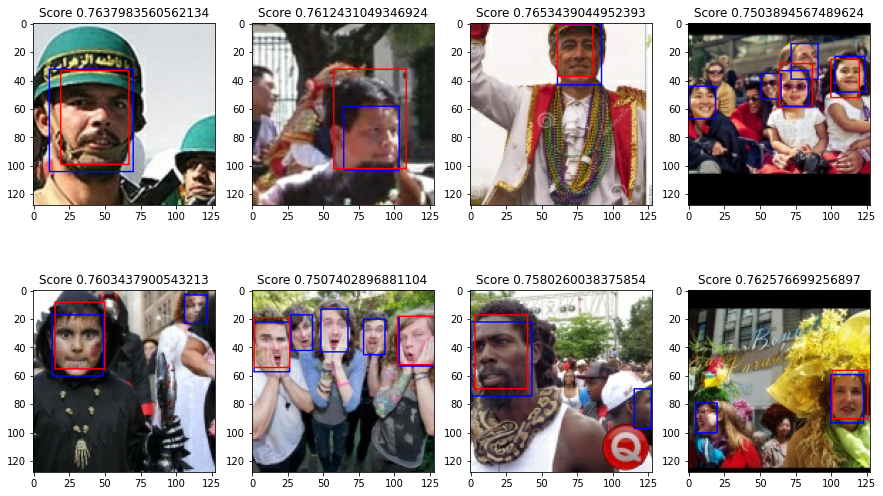

In [ ]:
test_model(output_detections[0:8], predicted_output_detections[0:8], imgs[0:8])

In [ ]:
model.save('saved_model/face_keras_500')

In [ ]:
converter = tf.lite.TFLiteConverter.from_saved_model('saved_model/face_keras_500')

In [ ]:
tflite_model = converter.convert()

In [ ]:
with open('face_keras_500.tflite', 'wb') as f:
  f.write(tflite_model)

In [ ]:
def apply_pruning_to_conv2d(layer):
  if isinstance(layer, tf.keras.layers.Conv2D):
    return tfmot.sparsity.keras.prune_low_magnitude(layer)
  return layer

In [ ]:
model_for_pruning = tf.keras.models.clone_model(
    keras_model,
    clone_function=apply_pruning_to_conv2d,
)

/usr/local/lib/python3.7/dist-packages/tensorflow/python/keras/engine/base_layer.py:2281: UserWarning: `layer.add_variable` is deprecated and will be removed in a future version. Please use `layer.add_weight` method instead.
  warnings.warn('`layer.add_variable` is deprecated and '


In [ ]:
model_for_pruning.summary()

In [ ]:
batch_size = 32
lr = 1e-4
optimizer = tf.keras.optimizers.Adam(learning_rate=lr)

In [ ]:
model_for_pruning.optimizer = optimizer
step_callback = tfmot.sparsity.keras.UpdatePruningStep()
step_callback.set_model(model_for_pruning)

In [ ]:
positive_accuracy_metric = tf.keras.metrics.BinaryAccuracy()
background_accuracy_metric = tf.keras.metrics.BinaryAccuracy()

In [ ]:
background_accuracy_results = []
positive_accuracy_results = []
loss_results = []
iou_results = []

In [ ]:
epochs = 25
unused_arg = -1

In [ ]:
step_callback.on_train_begin()
for epoch in range(epochs):
  batch_time = time.time()
  epoch_time = time.time()
  step = 0
  epoch_count = f"0{epoch + 1}/{epochs}" if epoch < 9 else f"{epoch + 1}/{epochs}"

  positive_accuracy_metric.reset_states()
  background_accuracy_metric.reset_states()

  for imgs, big_anchors, small_anchors, _, _ in train_generator:
    step_callback.on_train_batch_begin(batch=unused_arg)

    small_anchors = order_small_anchors_randomly(small_anchors)
    big_anchors = order_big_anchors_randomly(big_anchors)

    loss, filtered_pred_coords, filtered_true_coords, positive_class_predictions, background_class_predictions = train_step(imgs, big_anchors, small_anchors, reference_anchors, model_for_pruning)
    
    positive_accuracy_metric.update_state(tf.ones_like(positive_class_predictions), positive_class_predictions)
    background_accuracy_metric.update_state(tf.zeros_like(background_class_predictions), background_class_predictions)

    loss = float(loss)
    step += 1

    positive_accuracy = positive_accuracy_metric.result().numpy()
    background_accuracy = background_accuracy_metric.result().numpy()

    iou = mean_iou(filtered_true_coords * 128.0, filtered_pred_coords * 128.0)

    iou_results.append(iou)
    background_accuracy_results.append(background_accuracy)
    positive_accuracy_results.append(positive_accuracy)
    loss_results.append(loss)

    print('\r', 'Epoch', epoch_count, '| Step', f"{step}/{train_steps}",
          '| Loss:', f"{loss:.5f}", '| Positive Accuracy:', f"{positive_accuracy:.4f}",
          '| Background Accuracy:', f"{background_accuracy:.4f}",
          '| iou:', f"{iou:.4f}", "| Step Time:", f"{time.time() - batch_time:.2f}", end='')    
      
    batch_time = time.time()

  step_callback.on_epoch_end(batch=unused_arg)
  # checkpoint.save(file_prefix=checkpoint_prefix)

  print('\r', 'Epoch', epoch_count, '| Step', f"{step}/{train_steps}",
        '| Loss:', f"{loss:.5f}", '| Positive Accuracy:', f"{positive_accuracy:.4f}",
        '| Background Accuracy:', f"{background_accuracy:.4f}",
        '| iou:', f"{iou:.4f}", "| Epoch Time:", f"{time.time() - epoch_time:.2f}")

 Epoch 01/25 | Step 280/280 | Loss: 97.59262 | Positive Accuracy: 0.3174 | Background Accuracy: 0.6270 | iou: 0.3263 | Epoch Time: 187.30
 Epoch 02/25 | Step 280/280 | Loss: 81.86832 | Positive Accuracy: 0.4563 | Background Accuracy: 0.4754 | iou: 0.3510 | Epoch Time: 170.19
 Epoch 03/25 | Step 280/280 | Loss: 66.72083 | Positive Accuracy: 0.4832 | Background Accuracy: 0.4499 | iou: 0.3864 | Epoch Time: 174.36
 Epoch 04/25 | Step 280/280 | Loss: 60.96605 | Positive Accuracy: 0.5042 | Background Accuracy: 0.4423 | iou: 0.4118 | Epoch Time: 169.27
 Epoch 05/25 | Step 280/280 | Loss: 60.75950 | Positive Accuracy: 0.5209 | Background Accuracy: 0.4406 | iou: 0.4075 | Epoch Time: 169.46
 Epoch 06/25 | Step 280/280 | Loss: 59.31515 | Positive Accuracy: 0.5336 | Background Accuracy: 0.4439 | iou: 0.4389 | Epoch Time: 171.31
 Epoch 07/25 | Step 280/280 | Loss: 62.47639 | Positive Accuracy: 0.5436 | Background Accuracy: 0.4485 | iou: 0.4681 | Epoch Time: 169.26
 Epoch 08/25 | Step 280/280 | Loss

In [ ]:
step_callback.on_train_begin()
for epoch in range(epochs):
  batch_time = time.time()
  epoch_time = time.time()
  step = 0
  epoch_count = f"0{epoch + 1}/{epochs}" if epoch < 9 else f"{epoch + 1}/{epochs}"

  positive_accuracy_metric.reset_states()
  background_accuracy_metric.reset_states()

  for imgs, big_anchors, small_anchors, _, _ in train_generator:
    step_callback.on_train_batch_begin(batch=unused_arg)

    small_anchors = order_small_anchors_randomly(small_anchors)
    big_anchors = order_big_anchors_randomly(big_anchors)

    loss, filtered_pred_coords, filtered_true_coords, positive_class_predictions, background_class_predictions = train_step(imgs, big_anchors, small_anchors, reference_anchors, model_for_pruning)
    
    positive_accuracy_metric.update_state(tf.ones_like(positive_class_predictions), positive_class_predictions)
    background_accuracy_metric.update_state(tf.zeros_like(background_class_predictions), background_class_predictions)

    loss = float(loss)
    step += 1

    positive_accuracy = positive_accuracy_metric.result().numpy()
    background_accuracy = background_accuracy_metric.result().numpy()

    iou = mean_iou(filtered_true_coords * 128.0, filtered_pred_coords * 128.0)

    iou_results.append(iou)
    background_accuracy_results.append(background_accuracy)
    positive_accuracy_results.append(positive_accuracy)
    loss_results.append(loss)

    print('\r', 'Epoch', epoch_count, '| Step', f"{step}/{train_steps}",
          '| Loss:', f"{loss:.5f}", '| Positive Accuracy:', f"{positive_accuracy:.4f}",
          '| Background Accuracy:', f"{background_accuracy:.4f}",
          '| iou:', f"{iou:.4f}", "| Step Time:", f"{time.time() - batch_time:.2f}", end='')    
      
    batch_time = time.time()

  step_callback.on_epoch_end(batch=unused_arg)
  # checkpoint.save(file_prefix=checkpoint_prefix)

  print('\r', 'Epoch', epoch_count, '| Step', f"{step}/{train_steps}",
        '| Loss:', f"{loss:.5f}", '| Positive Accuracy:', f"{positive_accuracy:.4f}",
        '| Background Accuracy:', f"{background_accuracy:.4f}",
        '| iou:', f"{iou:.4f}", "| Epoch Time:", f"{time.time() - epoch_time:.2f}")

 Epoch 01/25 | Step 280/280 | Loss: 94.78157 | Positive Accuracy: 0.3527 | Background Accuracy: 0.5975 | iou: 0.3545 | Epoch Time: 454.56
 Epoch 02/25 | Step 280/280 | Loss: 70.30383 | Positive Accuracy: 0.4717 | Background Accuracy: 0.4724 | iou: 0.3910 | Epoch Time: 452.45
 Epoch 03/25 | Step 280/280 | Loss: 59.66653 | Positive Accuracy: 0.5062 | Background Accuracy: 0.4543 | iou: 0.4164 | Epoch Time: 455.50
 Epoch 04/25 | Step 280/280 | Loss: 59.99653 | Positive Accuracy: 0.5300 | Background Accuracy: 0.4521 | iou: 0.4395 | Epoch Time: 448.10
 Epoch 05/25 | Step 280/280 | Loss: 56.32618 | Positive Accuracy: 0.5464 | Background Accuracy: 0.4545 | iou: 0.4814 | Epoch Time: 447.65
 Epoch 06/25 | Step 280/280 | Loss: 51.62900 | Positive Accuracy: 0.5568 | Background Accuracy: 0.4612 | iou: 0.5232 | Epoch Time: 448.50
 Epoch 07/25 | Step 280/280 | Loss: 60.83896 | Positive Accuracy: 0.5675 | Background Accuracy: 0.4662 | iou: 0.4922 | Epoch Time: 538.74
 Epoch 08/25 | Step 280/280 | Loss

In [ ]:
import os
import zipfile
import tempfile

def get_gzipped_model_size(model):
  # Returns size of gzipped model, in bytes.
  _, keras_file = tempfile.mkstemp('.h5')
  model.save(keras_file, include_optimizer=False)

  _, zipped_file = tempfile.mkstemp('.zip')
  with zipfile.ZipFile(zipped_file, 'w', compression=zipfile.ZIP_DEFLATED) as f:
    f.write(keras_file)

  return os.path.getsize(zipped_file)

In [ ]:
model_for_pruning.save("pruned_model", include_optimizer=True)

INFO:tensorflow:Assets written to: pruned_model/assets


INFO:tensorflow:Assets written to: pruned_model/assets


In [ ]:
!zip -qr pruned_model.zip pruned_model

In [ ]:
_, keras_model_file = tempfile.mkstemp('.h5')

model_for_pruning.save(keras_model_file, include_optimizer=True)

In [ ]:
tfmot.sparsity.keras.strip_pruning._strip

In [ ]:
model_for_pruning

In [ ]:
model_for_export = tfmot.sparsity.keras.strip_pruning(model_for_pruning)

In [ ]:
print("Size of gzipped pruned model without stripping: %.2f bytes" % (get_gzipped_model_size(model_for_pruning)))
print("Size of gzipped pruned model with stripping: %.2f bytes" % (get_gzipped_model_size(model_for_export)))

Size of gzipped pruned model without stripping: 284035.00 bytes
Size of gzipped pruned model with stripping: 253792.00 bytes


In [ ]:
print("Size of gzipped keras model: %.2f bytes" % (get_gzipped_model_size(keras_model)))

Size of gzipped keras model: 253798.00 bytes


In [ ]:
model_for_pruning.save("saved_model/500_pruned")

INFO:tensorflow:Assets written to: saved_model/500_pruned/assets


INFO:tensorflow:Assets written to: saved_model/500_pruned/assets


In [ ]:
!zip -qr pruned_model.zip saved_model

In [ ]:
iou_test_metric = 0
class_test_metric = 0
batch_number = 1
extra_faces_list = []

In [ ]:
for image_paths, imgs, big_anchors, small_anchors in test_generator:
  anchor_predictions, class_predictions = model_for_export.predict(imgs)

  batch_iou, class_scores, extra_faces_paths = get_model_metrics(big_anchors, small_anchors, class_predictions, anchor_predictions, reference_anchors, image_paths)

  iou_test_metric += batch_iou
  class_test_metric += class_scores
  extra_faces_list.extend(extra_faces_paths)

  batch_number += 1

In [ ]:
iou_test_metric / batch_number, class_test_metric / batch_number

(0.37734806002923377, 0.4133919006173773)

In [ ]:
for image_paths, imgs, big_anchors, small_anchors in test_generator:
  break

In [ ]:
output_detections, predicted_output_detections = get_final_boxes(imgs, big_anchors, small_anchors, reference_anchors, model_for_export)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


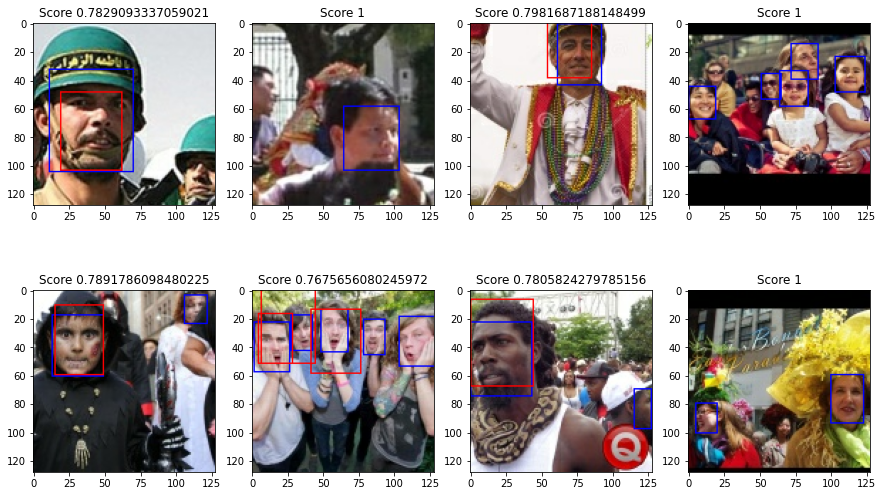

In [ ]:
test_model(output_detections[0:8], predicted_output_detections[0:8], imgs[0:8])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


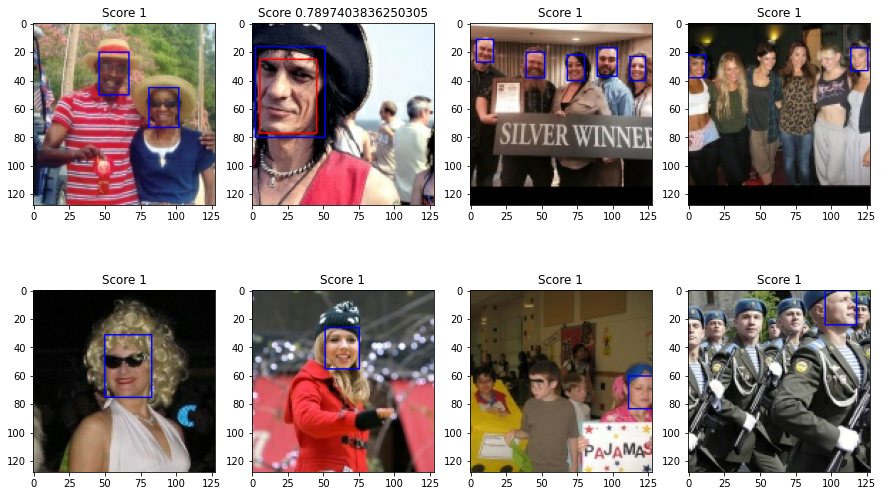

In [ ]:
test_model(output_detections[8:16], predicted_output_detections[8:16], imgs[8:16])